In [1]:
import cmocean.cm as cm
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import matplotlib.patches as patches
import scipy as sp
import datetime as dt
import pandas as pd
import matplotlib.dates as mdates
import matplotlib.cm as cma

from salishsea_tools import viz_tools

In [2]:
#Importing Jan2018 data

uvel = xr.open_dataset('/ocean/cstang/general/files_reshaped/SalishSeaCast_monthly_uvel_test_20180101_20180301.nc')
vvel = xr.open_dataset('/ocean/cstang/general/files_reshaped/SalishSeaCast_monthly_vvel_test_20180101_20180301.nc')

In [3]:
#Mesh

mesh = xr.open_dataset('/home/sallen/MEOPAR/grid/mesh_mask202108.nc')
vmask = 1 - mesh.vmask[0]

mesh.vmask[0]

e1v = mesh.e1v.values[0]
e1t = mesh.e1v.values[0]

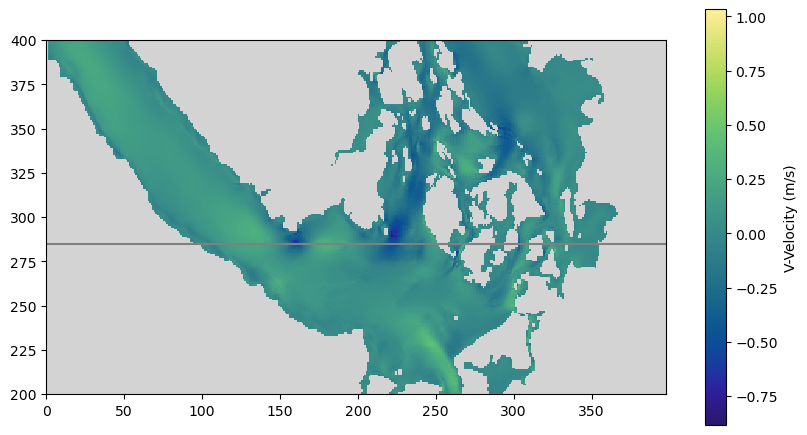

In [4]:
cmap = cm.haline
cmap.set_bad('lightgray')
fig, ax = plt.subplots(1, 1, figsize=(10, 18))
vfull = np.ma.masked_array(vvel.vomecrty[1, 0], mask=vmask[0])
ax.pcolormesh(vfull)
colours = ax.pcolormesh(vfull, cmap=cmap)
ax.set_ylim([200,400])
cb = fig.colorbar(colours, ax=ax,shrink = 0.3)
cb.set_label('V-Velocity (m/s)')
viz_tools.set_aspect(ax);
plt.axhline(y = 285,color='grey')


Text(0, 0.5, 'Depth (m)')

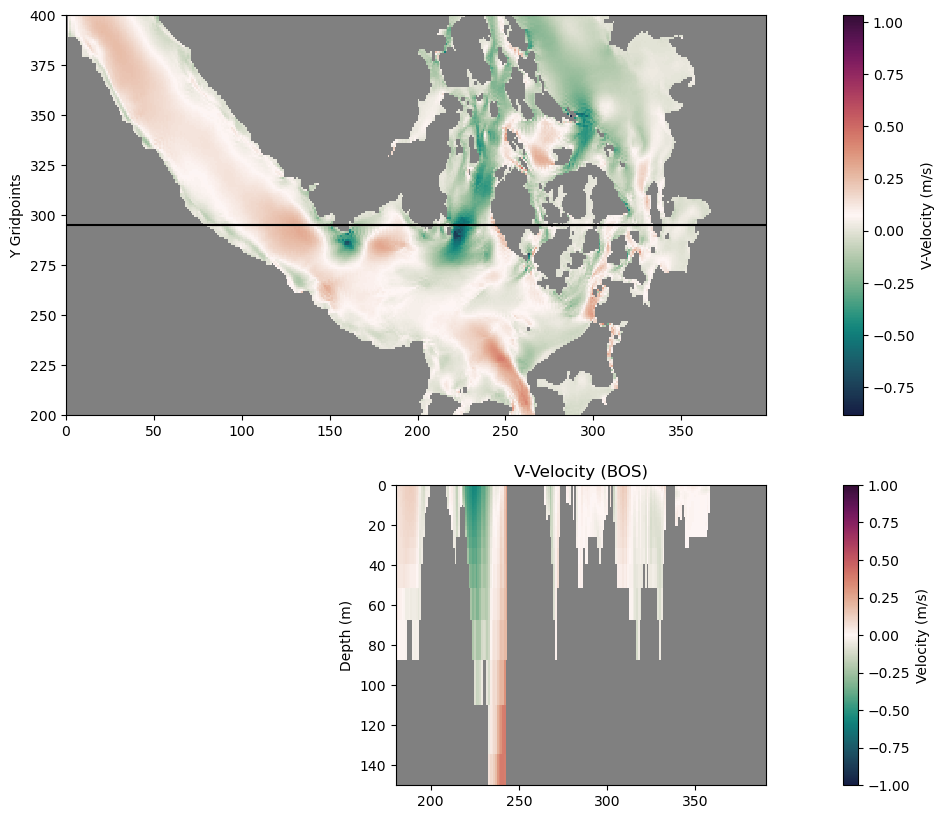

In [5]:
#Horizontal cross section at beginning of straits

lat_set = 295

fig, ax = plt.subplots(2, 1, figsize=(20, 10),gridspec_kw= {'height_ratios':[1.33,1]})

cmap = cm.curl
cmap.set_bad('gray')
vfull = np.ma.masked_array(vvel.vomecrty[1, 0], mask=vmask[0])
ax[0].pcolormesh(vfull)
colours = ax[0].pcolormesh(vfull, cmap=cmap)
ax[0].set_ylim([200,400])
#ax[0].set_xlim(180,390)
cb = fig.colorbar(colours, ax=ax[0])
cb.set_label('V-Velocity (m/s)')
viz_tools.set_aspect(ax[0]);
ax[0].axhline(y = lat_set,color='grey')
ax[0].set_ylabel('Y Gridpoints')

northvel = np.ma.masked_array(vvel.vomecrty[1, :, lat_set, :], mask=vmask[:, lat_set, :])
colours = ax[1].pcolormesh(vvel.gridX, vvel.depth, northvel, cmap=cmap, vmax=1.0, vmin=-1.0)
ax[1].set_ylim(0, 150)
ax[1].set_xlim(180,390)
ax[1].invert_yaxis();
cb = fig.colorbar(colours, ax=ax[1])
cb.set_label('Velocity (m/s)');
viz_tools.set_aspect(ax[1]);
ax[1].set_title('V-Velocity (BOS)')
ax[0].axhline(y = lat_set,color='k')
ax[1].set_ylabel('Depth (m)')


Text(0, 0.5, 'Depth (m)')

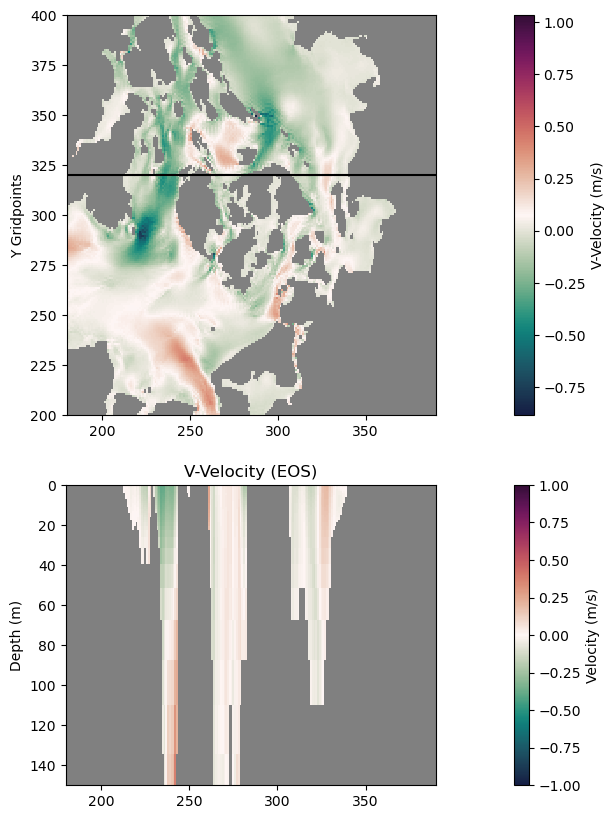

In [6]:
#Horizontal cross section at end of straits

lat_set = 320

fig, ax = plt.subplots(2, 1, figsize=(20, 10),gridspec_kw= {'height_ratios':[1.33,1]})

cmap = cm.curl
cmap.set_bad('gray')
vfull = np.ma.masked_array(vvel.vomecrty[1, 0], mask=vmask[0])
ax[0].pcolormesh(vfull)
colours = ax[0].pcolormesh(vfull, cmap=cmap)
ax[0].set_ylim([200,400])
ax[0].set_xlim(180,390)
cb = fig.colorbar(colours, ax=ax[0])
cb.set_label('V-Velocity (m/s)')
viz_tools.set_aspect(ax[0]);
ax[0].axhline(y = lat_set,color='grey')
ax[0].set_ylabel('Y Gridpoints')

northvel = np.ma.masked_array(vvel.vomecrty[1, :, lat_set, :], mask=vmask[:, lat_set, :])
colours = ax[1].pcolormesh(vvel.gridX, vvel.depth, northvel, cmap=cmap, vmax=1.0, vmin=-1.0)
ax[1].set_ylim(0, 150)
ax[1].set_xlim(180,390)
ax[1].invert_yaxis();
cb = fig.colorbar(colours, ax=ax[1])
cb.set_label('Velocity (m/s)');
viz_tools.set_aspect(ax[1]);
ax[1].set_title('V-Velocity (EOS)')
ax[0].axhline(y = lat_set,color='k')
ax[1].set_ylabel('Depth (m)')


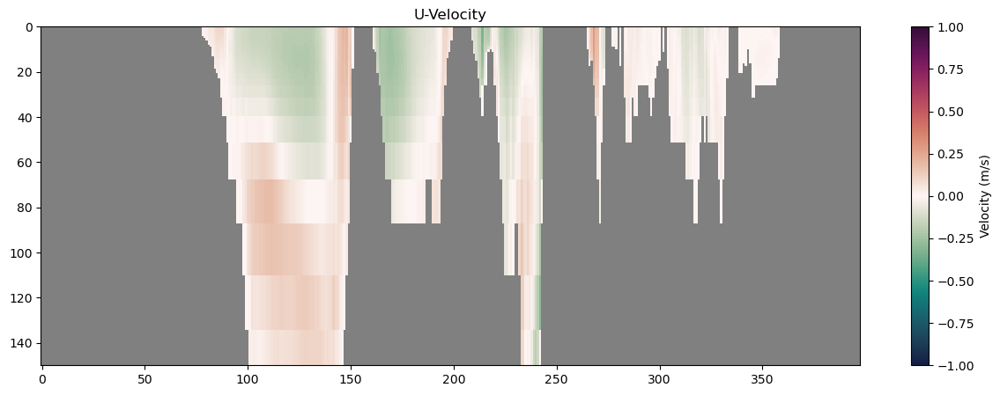

In [7]:
#Horizontal cross section at beginning of straits - u velocity

cmap = cm.haline
cmap.set_bad('gray')

fig, ax = plt.subplots(1, 1, figsize=(15, 5))
cmap = cm.curl
cmap.set_bad('grey')
northvel = np.ma.masked_array(uvel.vozocrtx[1, :, 295, :], mask=vmask[:, 295, :])
colours = ax.pcolormesh(uvel.gridX, uvel.depth, northvel, cmap=cmap, vmax=1.0, vmin=-1.0)
ax.set_ylim(0, 150)
ax.invert_yaxis();
cb = fig.colorbar(colours, ax=ax)
cb.set_label('Velocity (m/s)');
ax.set_title('U-Velocity');

In [8]:
#Import Jul18 data
vvel2 = xr.open_dataset('/ocean/cstang/general/files_reshaped/SalishSeaCast_monthly_vvel_2018_20180601_20180901.nc')

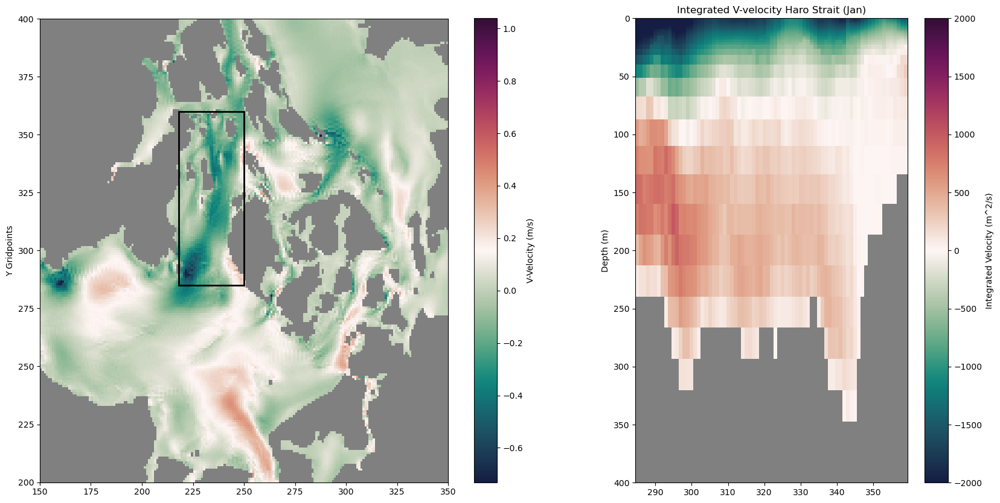

In [9]:
#Haro - Single + map

haro_latrange = [285,360]
haro_lonrange = [218,250]

haro_int_jan = np.zeros((40,haro_latrange[1]-haro_latrange[0]))

for i in range(haro_latrange[0],haro_latrange[1]):
    for j in range(40):
        haro_int_jan[j,i-haro_latrange[0]] = sp.integrate.simpson(vvel.vomecrty[0,j,i,haro_lonrange[0]:haro_lonrange[1]]*e1v[i,haro_lonrange[0]:haro_lonrange[1]])

haro_int_jan[haro_int_jan == 0] = np.nan

fig, ax = plt.subplots(1,2, figsize=(20, 10),gridspec_kw= {'width_ratios':[1.5,1]})

cmap = cm.curl
cmap.set_bad('gray')
vfull = np.ma.masked_array(vvel.vomecrty[0, 0], mask=vmask[0])
ax[0].pcolormesh(vfull)
colours = ax[0].pcolormesh(vfull, cmap=cmap)
ax[0].set_ylim([200,400])
ax[0].set_xlim([150,350])
cb = fig.colorbar(colours, ax=ax[0])
cb.set_label('V-Velocity (m/s)')
viz_tools.set_aspect(ax[0]);
ax[0].set_ylabel('Y Gridpoints')

colours = ax[1].pcolormesh( vvel.gridY[haro_latrange[0]:haro_latrange[1]],vvel.depth,haro_int_jan, cmap=cmap,vmin=-2000,vmax=2000)
ax[1].set_ylim(0, 400)
ax[1].invert_yaxis();
cb = fig.colorbar(colours, ax=ax[1])
cb.set_label('Integrated Velocity (m^2/s)');
ax[1].set_title('Integrated V-velocity Haro Strait (Jan)')
ax[1].set_ylabel('Depth (m)')

rect = patches.Rectangle((haro_lonrange[0],haro_latrange[0]),haro_lonrange[1]-haro_lonrange[0],haro_latrange[1]-haro_latrange[0],fill=None,lw=2)
ax[0].add_patch(rect)

Text(0.5, 0, 'X Gridpoints')

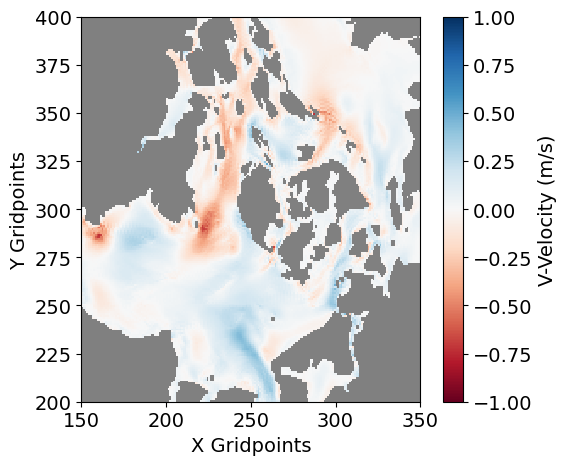

In [10]:
#Plot region of interest

fs2 = 14

fig, ax = plt.subplots(1,1, figsize=(6, 5))

cmap = cma.RdBu
cmap.set_bad('gray')

colours = ax.pcolormesh(vfull, cmap=cmap,vmin=-1,vmax=1)
ax.set_ylim([200,400])
ax.set_xlim([150,350])
ax.tick_params(axis='x', labelsize=fs2)
ax.tick_params(axis='y', labelsize=fs2)
cb = fig.colorbar(colours, ax=ax,shrink=1)
cb.ax.tick_params(labelsize=fs2)
cb.set_label('V-Velocity (m/s)',fontsize=fs2)
viz_tools.set_aspect(ax);
ax.set_ylabel('Y Gridpoints',fontsize=fs2)
ax.set_xlabel('X Gridpoints',fontsize=fs2)
# rect = patches.Rectangle((ros_lonrange[0],ros_latrange[0]),ros_lonrange[1]-ros_lonrange[0],ros_latrange[1]-ros_latrange[0],fill=None,lw=1.5)
# ax.add_patch(rect)
# rect = patches.Rectangle((haro_lonrange[0],haro_latrange[0]),haro_lonrange[1]-haro_lonrange[0],haro_latrange[1]-haro_latrange[0],fill=None,lw=1.5)
# ax.add_patch(rect)


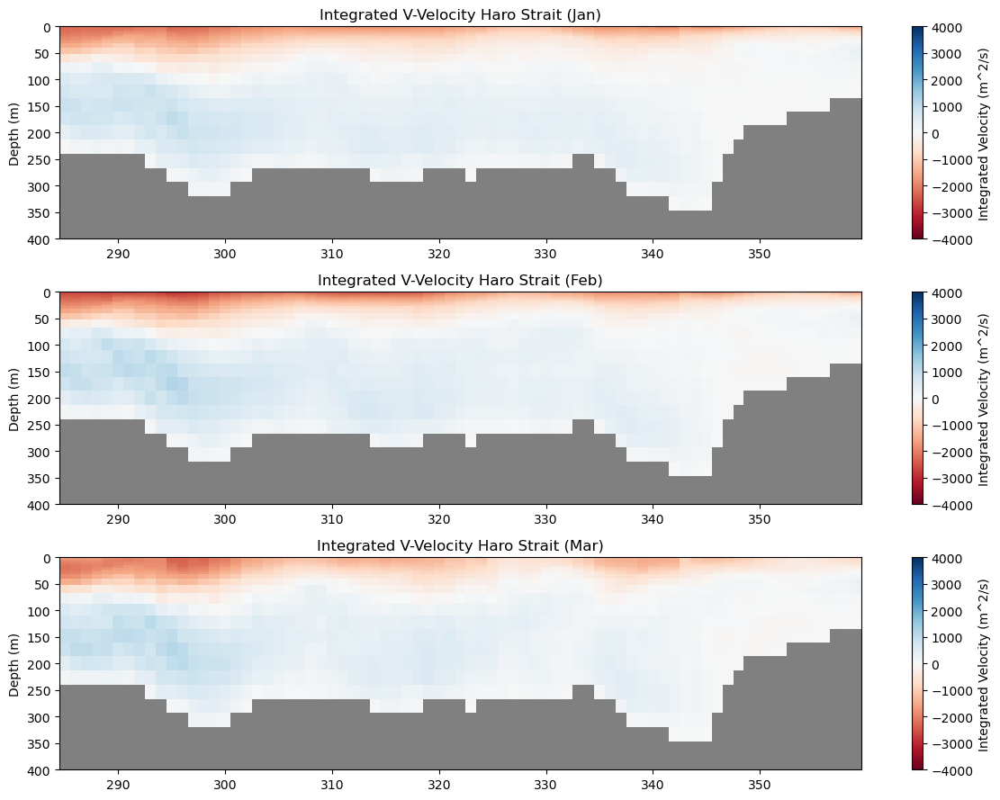

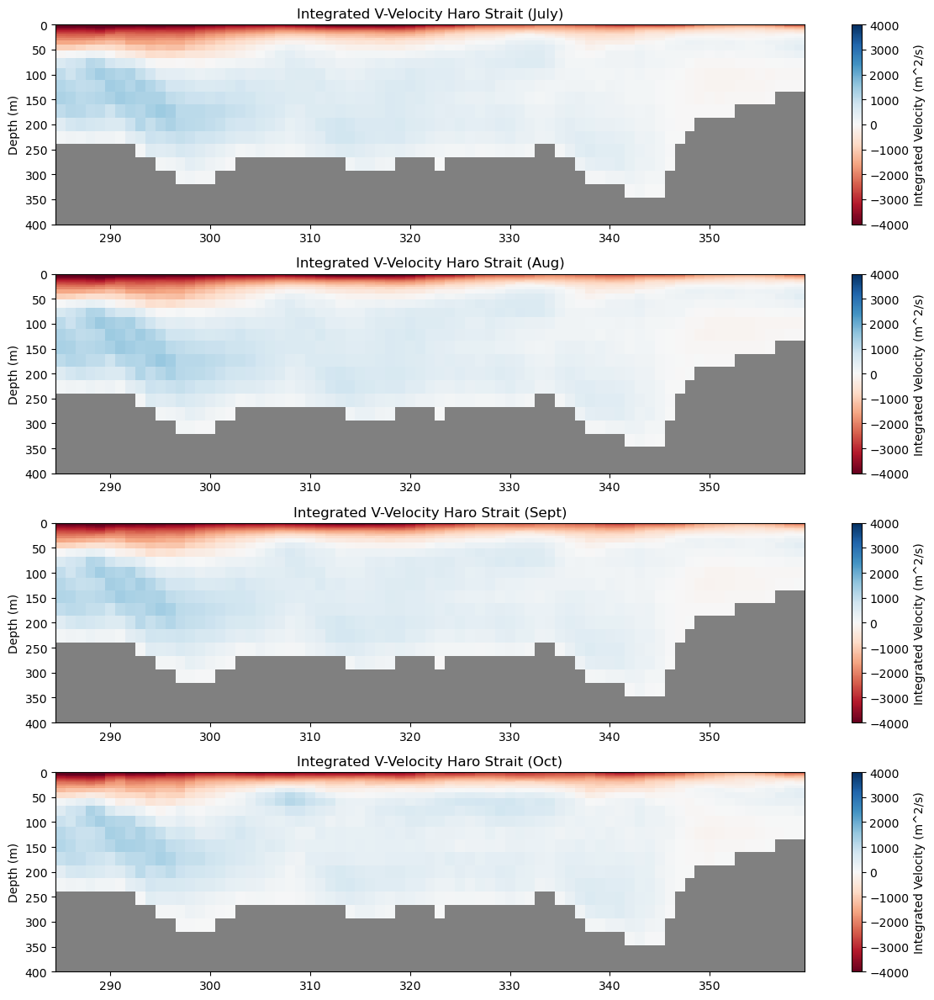

In [11]:
# Haro - Time series

fig, ax = plt.subplots(3,1, figsize=(12, 9))

for k in range(3):
    
    haro_int = np.zeros((40,haro_latrange[1]-haro_latrange[0]))

    for i in range(haro_latrange[0],haro_latrange[1]):
        for j in range(40):
            haro_int[j,i-haro_latrange[0]] = sp.integrate.simpson(vvel.vomecrty[k,j,i,haro_lonrange[0]:haro_lonrange[1]]*e1v[i,haro_lonrange[0]:haro_lonrange[1]])
    
    haro_int[haro_int == 0] = np.nan

    colours = ax[k].pcolormesh( vvel.gridY[haro_latrange[0]:haro_latrange[1]],vvel.depth,haro_int, cmap=cmap, 
                               
                                vmax=4000,vmin=-4000
                               )
    ax[k].set_ylim(0, 400)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated V-Velocity Haro Strait (Jan)')
ax[1].set_title(r'Integrated V-Velocity Haro Strait (Feb)')
ax[2].set_title(r'Integrated V-Velocity Haro Strait (Mar)')
fig.tight_layout()

fig, ax = plt.subplots(4,1, figsize=(12, 12))

for k in range(4):
    
    haro_int = np.zeros((40,haro_latrange[1]-haro_latrange[0]))

    for i in range(haro_latrange[0],haro_latrange[1]):
        for j in range(40):
            haro_int[j,i-haro_latrange[0]] = sp.integrate.simpson(vvel2.vomecrty[k,j,i,haro_lonrange[0]:haro_lonrange[1]]*e1v[i,haro_lonrange[0]:haro_lonrange[1]])
    
    haro_int[haro_int == 0] = np.nan

    colours = ax[k].pcolormesh( vvel2.gridY[haro_latrange[0]:haro_latrange[1]],vvel2.depth,haro_int, cmap=cmap, 
                                vmax=4000,vmin=-4000
                            )
    ax[k].set_ylim(0, 400)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated V-Velocity Haro Strait (July)')
ax[1].set_title(r'Integrated V-Velocity Haro Strait (Aug)')
ax[2].set_title(r'Integrated V-Velocity Haro Strait (Sept)')
ax[3].set_title(r'Integrated V-Velocity Haro Strait (Oct)')
fig.tight_layout()

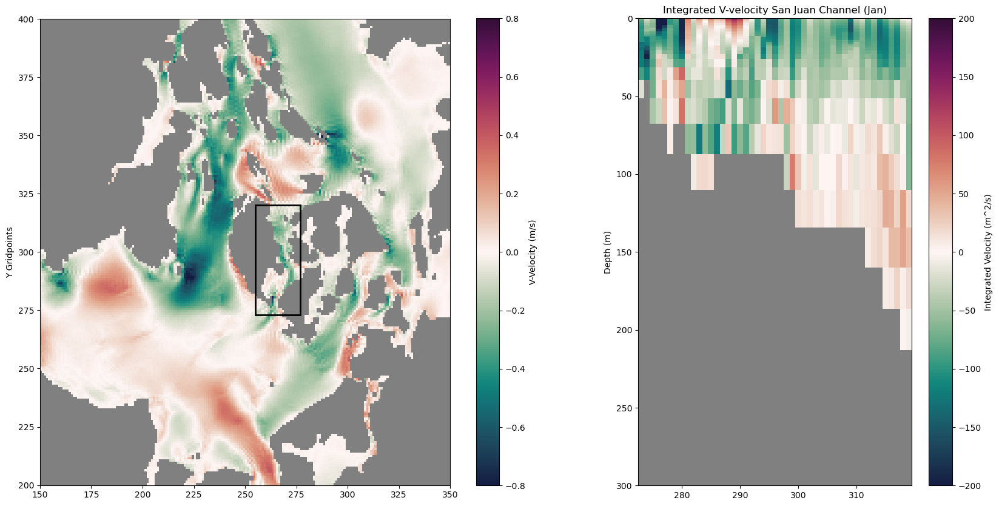

In [12]:
#SJC - January + map

sjc_latrange = [273,320]
sjc_lonrange = [255,277]

sjc_int_jan = np.zeros((40,sjc_latrange[1]-sjc_latrange[0]))

for i in range(sjc_latrange[0],sjc_latrange[1]):
    for j in range(40):
        sjc_int_jan[j,i-sjc_latrange[0]] = sp.integrate.simpson(vvel.vomecrty[0,j,i,sjc_lonrange[0]:sjc_lonrange[1]]*e1v[i,sjc_lonrange[0]:sjc_lonrange[1]])

sjc_int_jan[sjc_int_jan == 0] = np.nan

fig, ax = plt.subplots(1,2, figsize=(20, 10),gridspec_kw= {'width_ratios':[1.5,1]})

cmap = cm.curl
cmap.set_bad('gray')
vfull = np.ma.masked_array(vvel2.vomecrty[0, 0], mask=vmask[0])
ax[0].pcolormesh(vfull)
colours = ax[0].pcolormesh(vfull, cmap=cmap,vmin=-0.8,vmax = 0.8)
ax[0].set_ylim([200,400])
ax[0].set_xlim([150,350])
cb = fig.colorbar(colours, ax=ax[0])
cb.set_label('V-Velocity (m/s)')
viz_tools.set_aspect(ax[0]);
ax[0].set_ylabel('Y Gridpoints')

colours = ax[1].pcolormesh( vvel.gridY[sjc_latrange[0]:sjc_latrange[1]],vvel.depth,sjc_int_jan, cmap=cmap,
                            vmin=-200,vmax = 200
                           )
ax[1].set_ylim(0, 300)
ax[1].invert_yaxis();
cb = fig.colorbar(colours, ax=ax[1])
cb.set_label('Integrated Velocity (m^2/s)');
ax[1].set_title('Integrated V-velocity San Juan Channel (Jan)')
ax[1].set_ylabel('Depth (m)')

rect = patches.Rectangle((sjc_lonrange[0],sjc_latrange[0]),sjc_lonrange[1]-sjc_lonrange[0],sjc_latrange[1]-sjc_latrange[0],fill=None,lw=2)
ax[0].add_patch(rect)

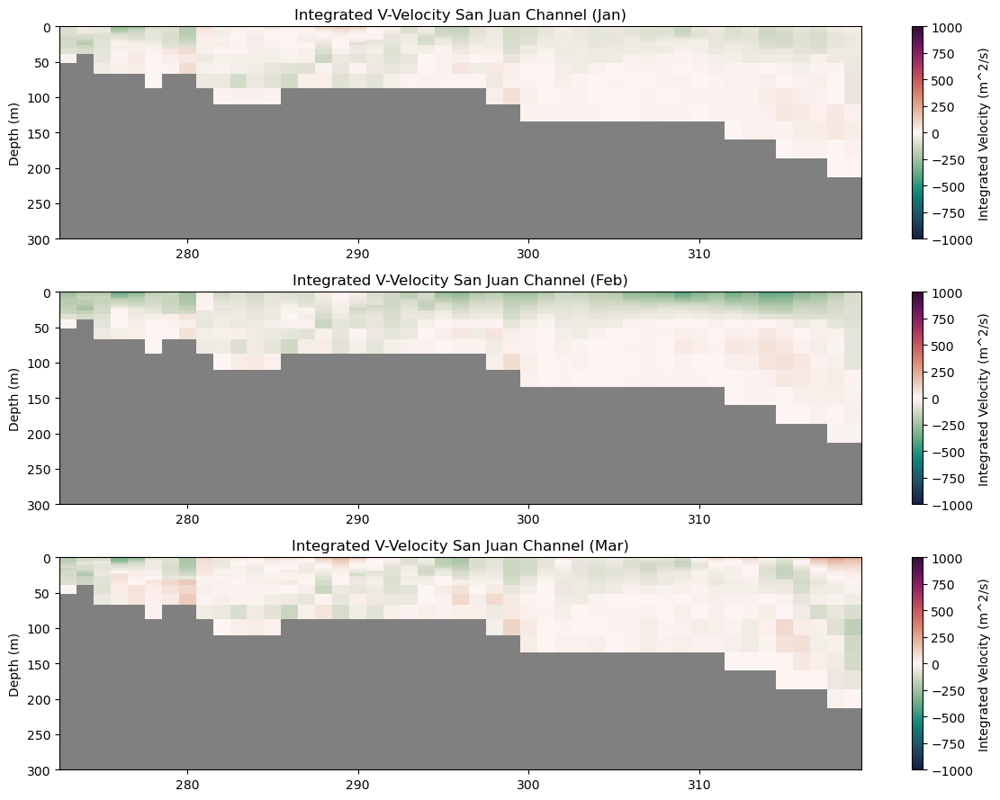

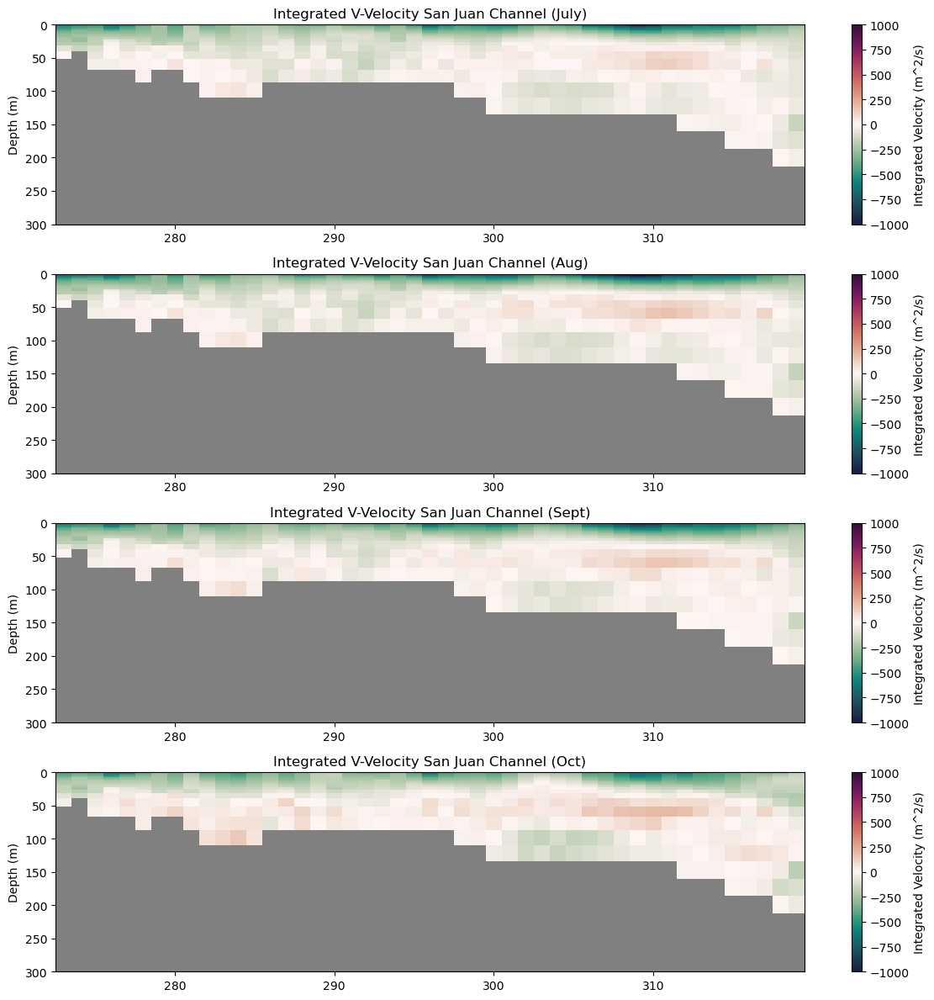

In [13]:
# SJC - Time series

fig, ax = plt.subplots(3,1, figsize=(12, 9))

for k in range(3):
    
    sjc_int = np.zeros((40,sjc_latrange[1]-sjc_latrange[0]))

    for i in range(sjc_latrange[0],sjc_latrange[1]):
        for j in range(40):
            sjc_int[j,i-sjc_latrange[0]] = sp.integrate.simpson(vvel.vomecrty[k,j,i,sjc_lonrange[0]:sjc_lonrange[1]]*e1v[i,sjc_lonrange[0]:sjc_lonrange[1]])
    
    sjc_int[sjc_int == 0] = np.nan

    #northvel = np.ma.masked_array(haro_int, mask=vmask[:, haro_latrange[0]:haro_latrange[1], lon_set])
    colours = ax[k].pcolormesh( vvel.gridY[sjc_latrange[0]:sjc_latrange[1]],vvel.depth,sjc_int, cmap=cmap,
                                vmin=-1000,vmax = 1000
                               )
    ax[k].set_ylim(0, 300)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated V-Velocity San Juan Channel (Jan)')
ax[1].set_title(r'Integrated V-Velocity San Juan Channel (Feb)')
ax[2].set_title(r'Integrated V-Velocity San Juan Channel (Mar)')
fig.tight_layout()

fig, ax = plt.subplots(4,1, figsize=(12, 12))

for k in range(4):
    
    sjc_int = np.zeros((40,sjc_latrange[1]-sjc_latrange[0]))

    for i in range(sjc_latrange[0],sjc_latrange[1]):
        for j in range(40):
            sjc_int[j,i-sjc_latrange[0]] = sp.integrate.simpson(vvel2.vomecrty[k,j,i,sjc_lonrange[0]:sjc_lonrange[1]]*e1v[i,sjc_lonrange[0]:sjc_lonrange[1]])
    
    sjc_int[sjc_int == 0] = np.nan

    colours = ax[k].pcolormesh( vvel2.gridY[sjc_latrange[0]:sjc_latrange[1]],vvel2.depth,sjc_int, cmap=cmap,
                                vmin=-1000,vmax = 1000
                               )
    ax[k].set_ylim(0, 300)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated V-Velocity San Juan Channel (July)')
ax[1].set_title(r'Integrated V-Velocity San Juan Channel (Aug)')
ax[2].set_title(r'Integrated V-Velocity San Juan Channel (Sept)')
ax[3].set_title(r'Integrated V-Velocity San Juan Channel (Oct)')
fig.tight_layout()

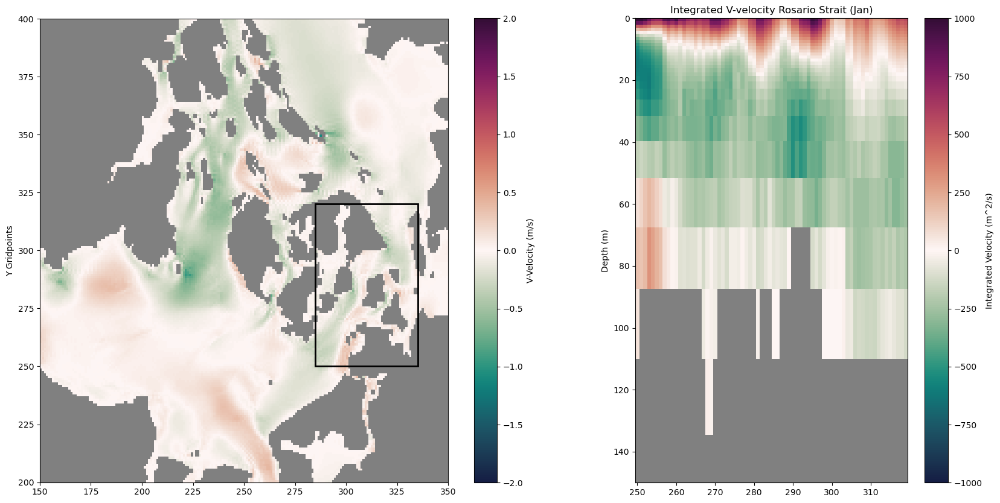

In [14]:
#Rosario - Jan + map

ros_latrange = [250,320]
ros_lonrange = [285,335]

ros_int_jan = np.zeros((40,ros_latrange[1]-ros_latrange[0]))

for i in range(ros_latrange[0],ros_latrange[1]):
    for j in range(40):
        ros_int_jan[j,i-ros_latrange[0]] = sp.integrate.simpson(vvel.vomecrty[0,j,i,ros_lonrange[0]:ros_lonrange[1]]*e1v[i,ros_lonrange[0]:ros_lonrange[1]])

ros_int_jan[ros_int_jan == 0] = np.nan

fig, ax = plt.subplots(1,2, figsize=(20, 10),gridspec_kw= {'width_ratios':[1.5,1]})

cmap = cm.curl
cmap.set_bad('gray')
vfull = np.ma.masked_array(vvel2.vomecrty[0, 0], mask=vmask[0])
ax[0].pcolormesh(vfull)
colours = ax[0].pcolormesh(vfull, cmap=cmap,vmin=-2,vmax = 2)
ax[0].set_ylim([200,400])
ax[0].set_xlim([150,350])
cb = fig.colorbar(colours, ax=ax[0])
cb.set_label('V-Velocity (m/s)')
viz_tools.set_aspect(ax[0]);
ax[0].set_ylabel('Y Gridpoints')

colours = ax[1].pcolormesh( vvel.gridY[ros_latrange[0]:ros_latrange[1]],vvel.depth,ros_int_jan, cmap=cmap,
                            vmin=-1000,vmax = 1000
                           )
ax[1].set_ylim(0, 150)
ax[1].invert_yaxis();
cb = fig.colorbar(colours, ax=ax[1])
cb.set_label('Integrated Velocity (m^2/s)');
ax[1].set_title('Integrated V-velocity Rosario Strait (Jan)')
ax[1].set_ylabel('Depth (m)')

rect = patches.Rectangle((ros_lonrange[0],ros_latrange[0]),ros_lonrange[1]-ros_lonrange[0],ros_latrange[1]-ros_latrange[0],fill=None,lw=2)
ax[0].add_patch(rect)

In [16]:
# Rosario - Time series

fig, ax = plt.subplots(3,1, figsize=(12, 9))

for k in range(3):
    
    ros_int = np.zeros((40,ros_latrange[1]-ros_latrange[0]))

    for i in range(ros_latrange[0],ros_latrange[1]):
        for j in range(40):
            ros_int[j,i-ros_latrange[0]] = sp.integrate.simpson(vvel.vomecrty[k,j,i,ros_lonrange[0]:ros_lonrange[1]]*e1v[i,ros_lonrange[0]:ros_lonrange[1]])
    
    ros_int[ros_int == 0] = np.nan

    colours = ax[k].pcolormesh( vvel.gridY[ros_latrange[0]:ros_latrange[1]],vvel.depth,ros_int, cmap=cmap,
                                vmin=-1000,vmax=1000
                               )
    ax[k].set_ylim(0, 150)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated V-Velocity Rosario Strait (Jan)')
ax[1].set_title(r'Integrated V-Velocity Rosario Strait (Feb)')
ax[2].set_title(r'Integrated V-Velocity Rosario Strait (Mar)'))
fig.tight_layout()

fig, ax = plt.subplots(4,1, figsize=(12, 12))

for k in range(4):
    
    ros_int = np.zeros((40,ros_latrange[1]-ros_latrange[0]))

    for i in range(ros_latrange[0],ros_latrange[1]):
        for j in range(40):
            ros_int[j,i-ros_latrange[0]] = sp.integrate.simpson(vvel2.vomecrty[k,j,i,ros_lonrange[0]:ros_lonrange[1]]*e1v[i,ros_lonrange[0]:ros_lonrange[1]])
    
    ros_int[ros_int == 0] = np.nan

    colours = ax[k].pcolormesh( vvel2.gridY[ros_latrange[0]:ros_latrange[1]],vvel2.depth,ros_int, cmap=cmap,
                                vmin = -1000,vmax=1000
                               )
    ax[k].set_ylim(0, 150)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated V-Velocity Rosario Strait (July)')
ax[1].set_title(r'Integrated V-Velocity Rosario Strait (Aug)')
ax[2].set_title(r'Integrated V-Velocity Rosario Strait (Sept)')
ax[3].set_title(r'Integrated V-Velocity Rosario Strait (Oct)')
fig.tight_layout()

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 43)

In [ ]:
#Import hourly velocity data - Jan18

jan_hourly = xr.open_dataset('/ocean/cstang/general/files_reshaped/SalishSeaCast_hourly_vvel_2018_01_01_20180101_20180102.nc')
date = pd.DatetimeIndex(jan_hourly.time.values)


1

# Tidal Analysis

In [ ]:
#Import daily velocity data - Jan18

jan_daily = xr.open_dataset('/ocean/cstang/general/files_reshaped/SalishSeaCast_daily_jan_2018_20180101_20180201.nc')

<xarray.Dataset>
Dimensions:   (time: 32, depth: 40, gridY: 898, gridX: 398)
Coordinates:
  * depth     (depth) float32 0.5 1.5 2.5 3.5 4.5 ... 360.7 387.6 414.5 441.5
  * gridY     (gridY) int64 0 1 2 3 4 5 6 7 ... 890 891 892 893 894 895 896 897
  * gridX     (gridX) int64 0 1 2 3 4 5 6 7 ... 390 391 392 393 394 395 396 397
  * time      (time) datetime64[ns] 2018-01-17 2018-01-18 ... 2018-02-17
Data variables:
    vomecrty  (time, depth, gridY, gridX) float32 ...
Attributes:
    name:         SalishSeaCast_daily_jan_2018_20180101_20180201
    description:  Monthly extracted from SalishSeaCast v202111 hindcast
    history:      2023-02-07 15:57 -08:00: Generated by `reshapr extract /oce...
    Conventions:  CF-1.6

Text(0.5, 1.03, 'Winter Daily Tides')

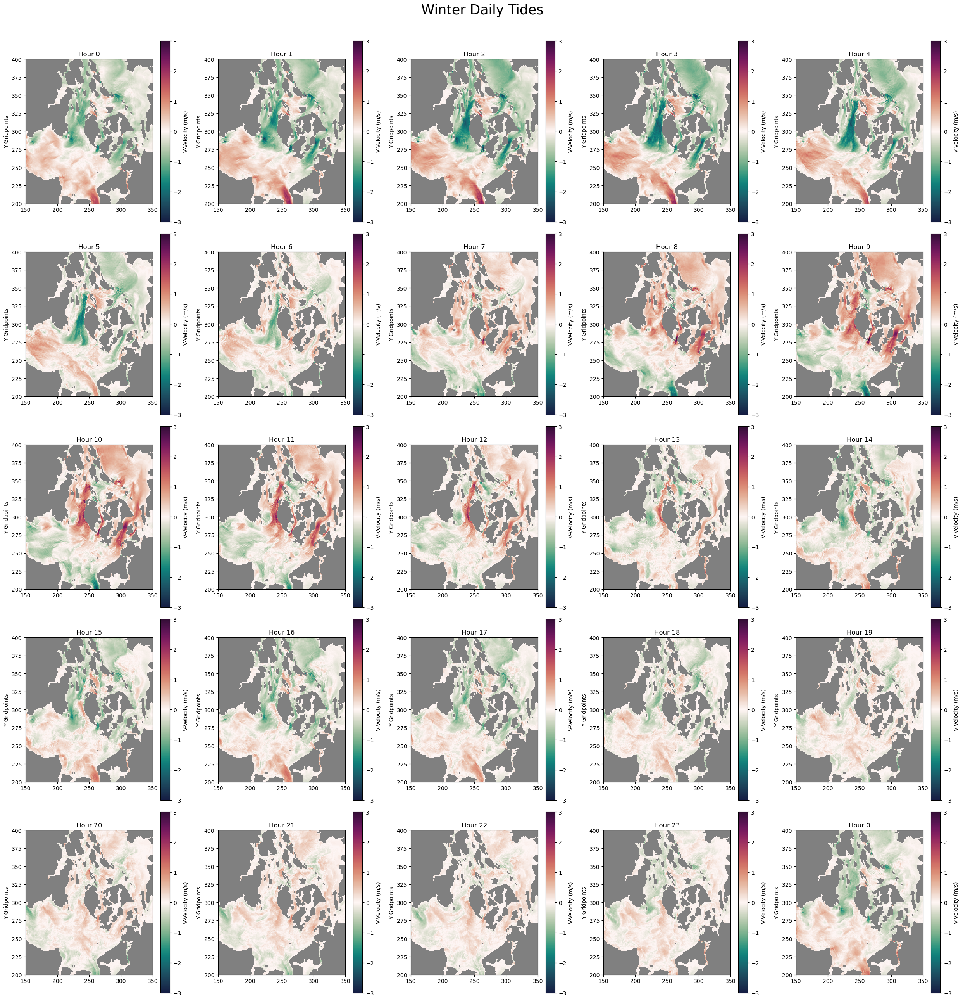

In [ ]:
#Plot daily tide cycle - Jan18

nrows = 5
ncols = 5

fig, ax = plt.subplots(nrows,ncols,figsize=(25, 25))
cmap = cm.curl
cmap.set_bad('gray')

for i in range(nrows):
    for j in range(ncols):
    
        vfull = np.ma.masked_array(jan_hourly.vomecrty[i*ncols+j, 0], mask=vmask[0])
        ax[i,j].pcolormesh(vfull,vmin=-3,vmax=3)
        colours = ax[i,j].pcolormesh(vfull, cmap=cmap,vmin=-3,vmax=3)
        ax[i,j].set_ylim([200,400])
        ax[i,j].set_xlim([150,350])
        cb = fig.colorbar(colours, ax=ax[i,j])
        cb.set_label('V-Velocity (m/s)')
        viz_tools.set_aspect(ax[i,j]);
        ax[i,j].set_ylabel('Y Gridpoints')
        ax[i,j].set_title(f'Hour {date[i*ncols+j].hour}')

fig.tight_layout()
fig.suptitle('Winter Daily Tides',y=1.03,size=25)


[1.7  1.15 0.58 0.19 0.07 0.24 0.59 0.96 1.36 1.83 2.07 2.16 2.23 2.31
 2.37 2.36 2.37 2.5  2.7  2.83 2.9  2.9  2.76 2.46]


Text(0.5, 0, 'Time (UTC)')

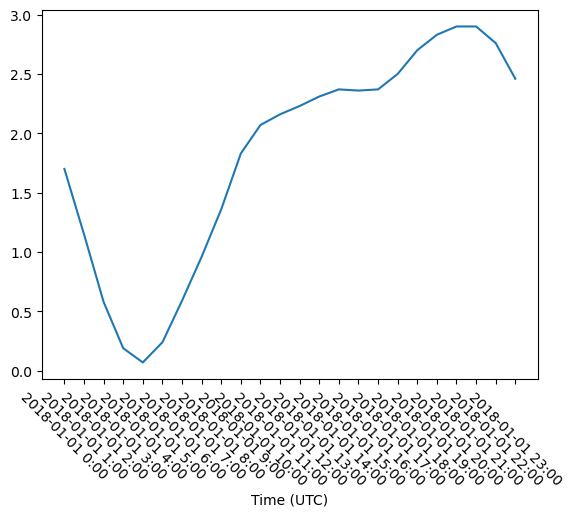

In [ ]:
#Import hourly tidal data - Jan01/18
#Plot tidal data

tides_hour = pd.read_csv('7120-31-DEC-2017_slev.csv')
print(np.array(tides_hour.iloc[0:24,1]))

plt.plot(tides_hour.iloc[0:24,0],tides_hour.iloc[0:24,1])
plt.xticks(rotation=-45)
plt.xlabel('Time (UTC)')

Text(0.5, 1.03, 'Winter Spring/Neap')

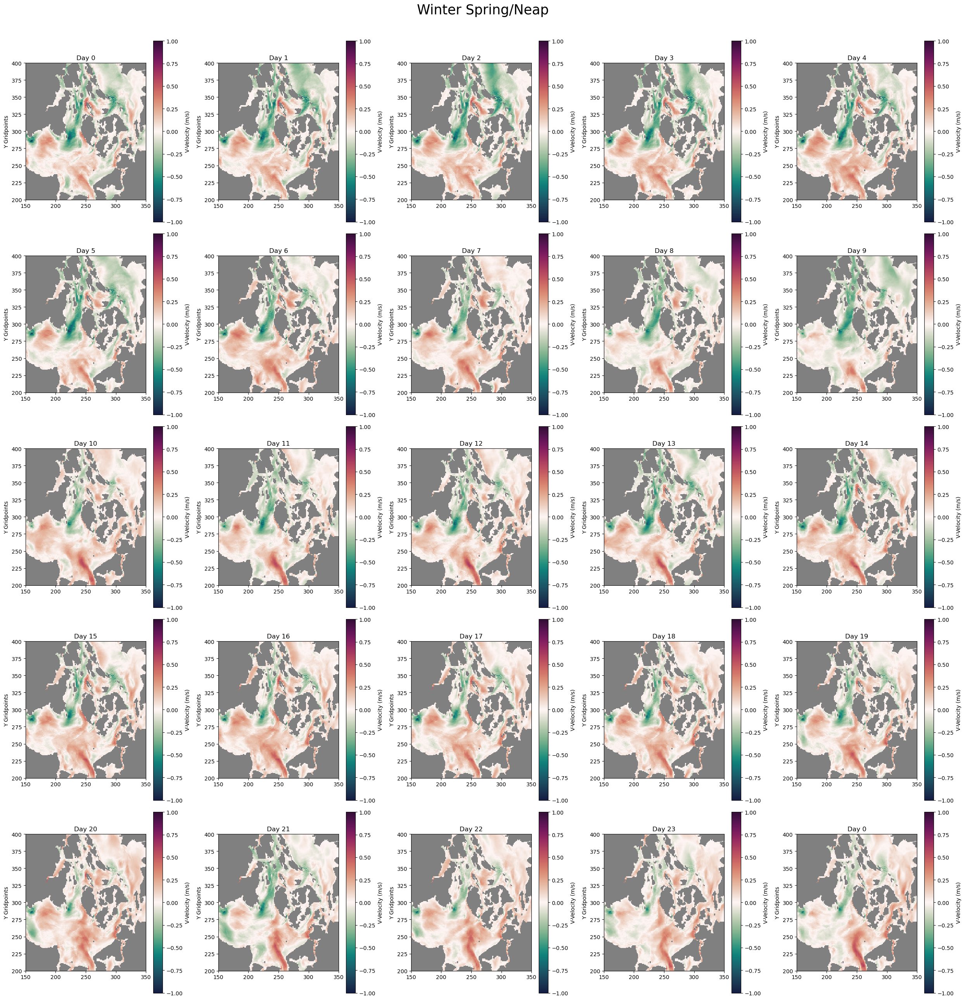

In [ ]:
#Plot velocities over spring/neap tidal cycle

nrows = 5
ncols = 5

fig, ax = plt.subplots(nrows,ncols,figsize=(25, 25))
cmap = cm.curl
cmap.set_bad('gray')

for i in range(nrows):
    for j in range(ncols):
    
        vfull = np.ma.masked_array(jan_daily.vomecrty[i*ncols+j, 0], mask=vmask[0])
        ax[i,j].pcolormesh(vfull,vmin=-3,vmax=3)
        colours = ax[i,j].pcolormesh(vfull, cmap=cmap,
                                      vmin=-1,vmax=1
                                     )
        ax[i,j].set_ylim([200,400])
        ax[i,j].set_xlim([150,350])
        cb = fig.colorbar(colours, ax=ax[i,j])
        cb.set_label('V-Velocity (m/s)')
        viz_tools.set_aspect(ax[i,j]);
        ax[i,j].set_ylabel('Y Gridpoints')
        ax[i,j].set_title(f'Day {date[i*ncols+j].hour}')

fig.tight_layout()
fig.suptitle('Winter Spring/Neap',y=1.03,size=25)


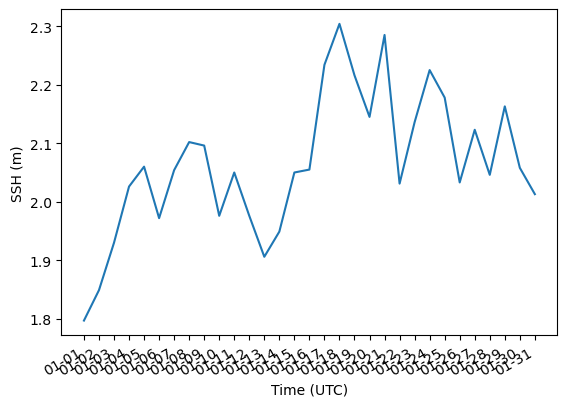

In [ ]:
#Import and plot tides in Jan18

jan_dtides = pd.read_csv('7120-01-JAN-2018_slev_month.csv')

fig,ax = plt.subplots()

ax.plot(jan_dtides.iloc[:,0],jan_dtides.iloc[:,1])
ax.set_xlabel('Time (UTC)')
ax.set_ylabel('SSH (m)')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
fig.autofmt_xdate()


### Summer 

In [ ]:
#Import velocities in Jul18

jul_daily = xr.open_dataset('/ocean/cstang/general/files_reshaped/SalishSeaCast_daily_jul_2018_20180701_20180731.nc')

Text(0.5, 1.03, 'Summer Spring/Neap')

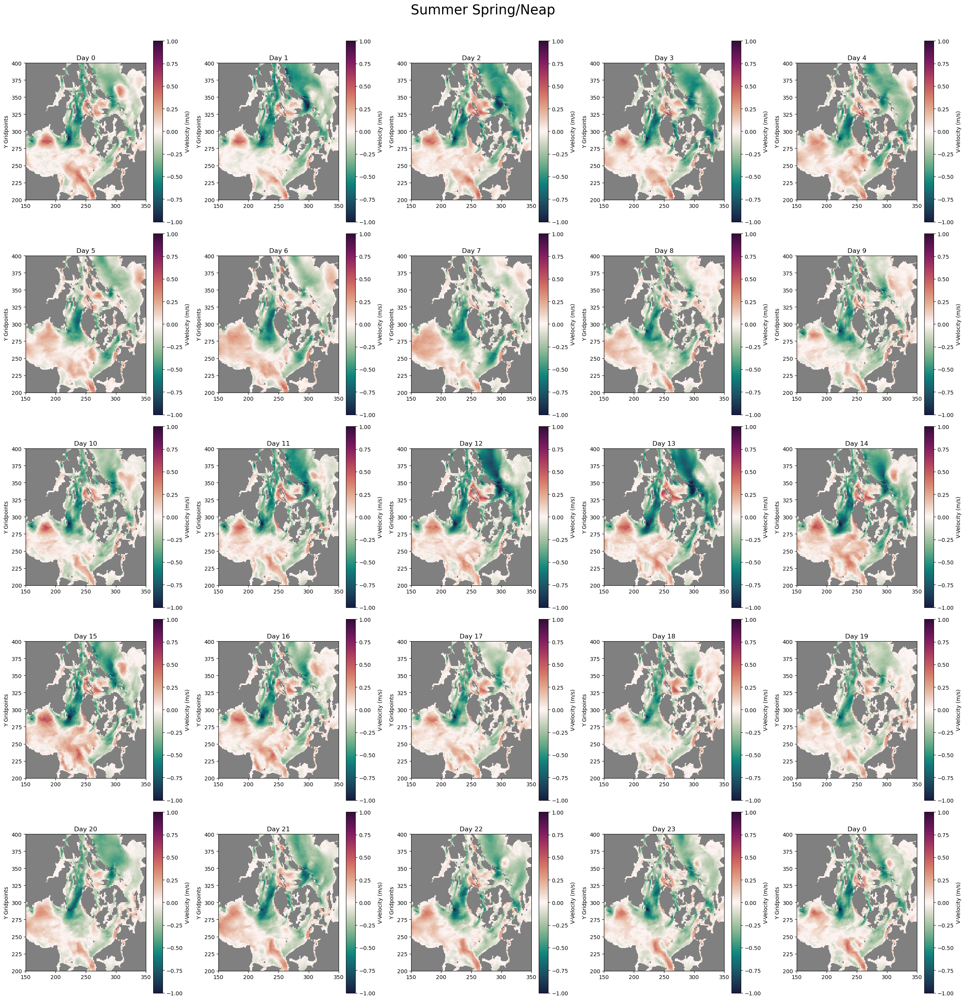

In [ ]:
#Plot velocities over spring/neap tidal cycle

nrows = 5
ncols = 5

fig, ax = plt.subplots(nrows,ncols,figsize=(25, 25))
cmap = cm.curl
cmap.set_bad('gray')

for i in range(nrows):
    for j in range(ncols):
    
        vfull = np.ma.masked_array(jul_daily.vomecrty[i*ncols+j, 0], mask=vmask[0])
        ax[i,j].pcolormesh(vfull,vmin=-3,vmax=3)
        colours = ax[i,j].pcolormesh(vfull, cmap=cmap,
                                      vmin=-1,vmax=1
                                     )
        ax[i,j].set_ylim([200,400])
        ax[i,j].set_xlim([150,350])
        cb = fig.colorbar(colours, ax=ax[i,j])
        cb.set_label('V-Velocity (m/s)')
        viz_tools.set_aspect(ax[i,j]);
        ax[i,j].set_ylabel('Y Gridpoints')
        ax[i,j].set_title(f'Day {date[i*ncols+j].hour}')

fig.tight_layout()
fig.suptitle('Summer Spring/Neap',y=1.03,size=25)

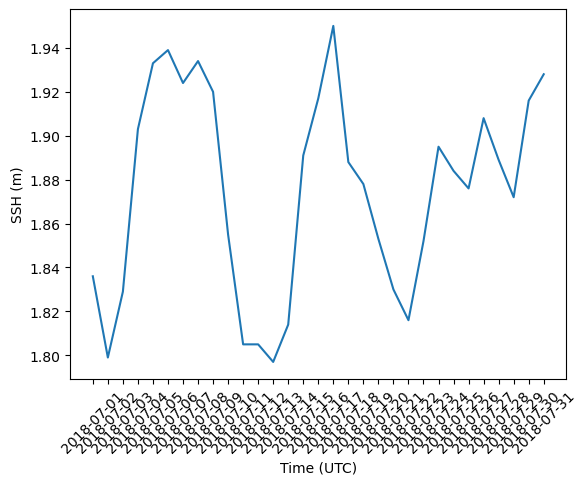

In [ ]:
#Import spring/neap tidal data 

jul_dtides = pd.read_csv('7120-01-JUL-2018_slev.csv')

plt.plot(jul_dtides.iloc[:,0],jul_dtides.iloc[:,1])
plt.xlabel('Time (UTC)')
plt.ylabel('SSH (m)')
plt.xticks(rotation =45);


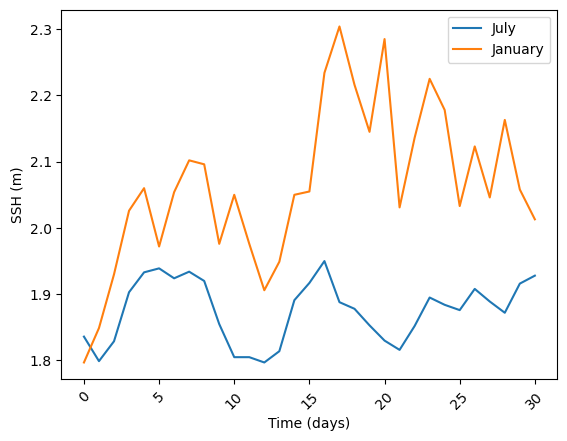

In [ ]:
#Compare spring/neap tides in winter vs. summer

plt.plot(jul_dtides.iloc[:,1],label='July')
plt.plot(jan_dtides.iloc[:,1],label='January')
plt.xlabel('Time (days)')
plt.ylabel('SSH (m)')
plt.xticks(rotation =45);
plt.legend();


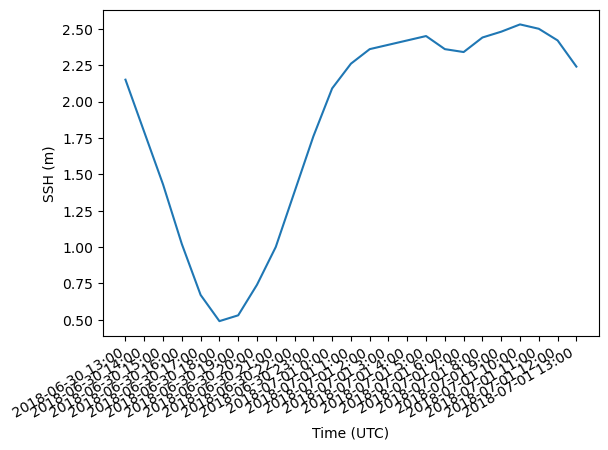

In [ ]:
#Plot hourly tides - Jul01/18

jul_htides = pd.read_csv('7120-30-JUN-2018_slev.csv')

fig,ax = plt.subplots()

ax.plot(jul_htides.iloc[5:30,0],jul_htides.iloc[5:30,1])
ax.set_xlabel('Time (UTC)')
ax.set_ylabel('SSH (m)')
fig.autofmt_xdate()

In [ ]:
#Import hourly velocities in Jul18
jul_hourly = xr.open_dataset('/ocean/cstang/general/files_reshaped/SalishSeaCast_hourly_vvel_2018_07_20180701_20180703.nc')


[ 0.          0.          0.2984764   0.09392577 -0.14533125 -0.32607037
 -0.41099936 -0.43798518 -0.40792134 -0.33138481 -0.25141364 -0.22890702
 -0.27258915 -0.36143935 -0.49722463 -0.65176362 -0.76808494 -0.80453628
 -0.77885753 -0.69389886 -0.50946033 -0.23780625  0.03563329  0.26791325
  0.38895211  0.40352067  0.33670276  0.17734246 -0.04639316 -0.25414449
 -0.38873509 -0.45551574 -0.46296635 -0.4240379  -0.33878604 -0.27213922
 -0.26002327 -0.31008625 -0.41713965 -0.55873799 -0.68992096 -0.77067029
 -0.79144228 -0.7422508  -0.60864359 -0.39569947 -0.12748922  0.13025218]
27
34


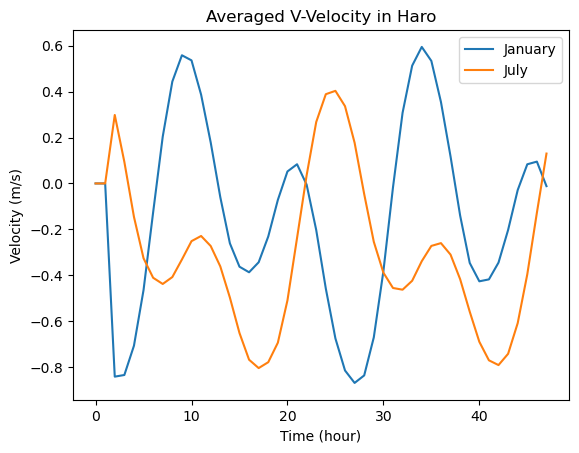

In [ ]:
# Finding max flood and max ebb
mean_v_jul = np.linspace(0,0,48)
mean_v_jan = np.linspace(0,0,48)

for i in range(2,48):
    mean_v_jul[i] = np.mean(jul_hourly.vomecrty[i,0,haro_latrange[0]:haro_latrange[1],haro_lonrange[0]:haro_lonrange[1]].values)
    mean_v_jan[i] = np.mean(jan_hourly.vomecrty[i,0,haro_latrange[0]:haro_latrange[1],haro_lonrange[0]:haro_lonrange[1]].values)

maxebbind_jul = np.argmin(mean_v_jul)
maxfloind_jul = np.argmax(mean_v_jul)
maxebbind_jan = np.argmin(mean_v_jan)
maxfloind_jan = np.argmax(mean_v_jan)

print(mean_v_jul)
print(maxebbind_jan)
print(maxfloind_jan)

plt.plot(mean_v_jan,label='January')
plt.plot(mean_v_jul,label='July')
plt.title('Averaged V-Velocity in Haro')
plt.ylabel('Velocity (m/s)')
plt.xlabel('Time (hour)')
plt.legend()

Text(0.5, 1.03, 'Summer Daily Tides')

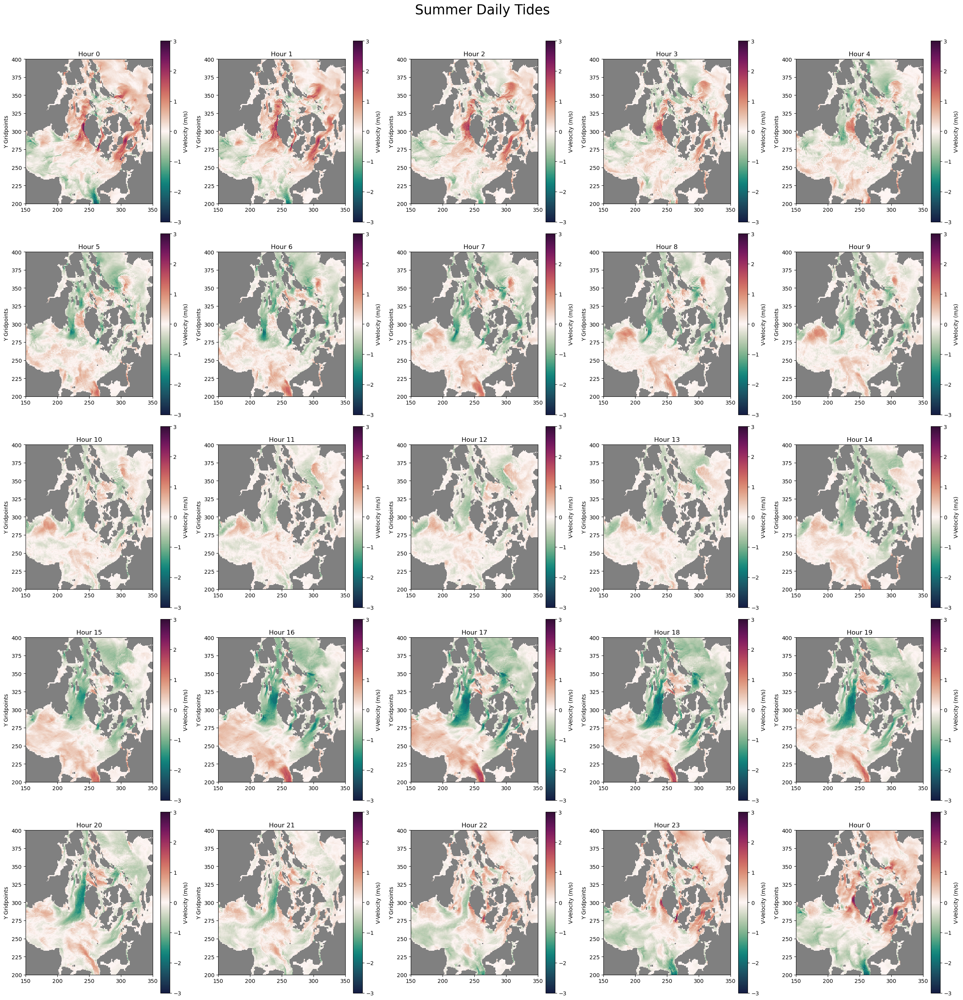

In [ ]:
#Plotting daily tides in Jul18

nrows = 5
ncols = 5

fig, ax = plt.subplots(nrows,ncols,figsize=(25, 25))
cmap = cm.curl
cmap.set_bad('gray')

for i in range(nrows):
    for j in range(ncols):
    
        vfull = np.ma.masked_array(jul_hourly.vomecrty[(i*ncols+j), 0], mask=vmask[0])
        ax[i,j].pcolormesh(vfull,vmin=-3,vmax=3)
        colours = ax[i,j].pcolormesh(vfull, cmap=cmap,vmin=-3,vmax=3)
        ax[i,j].set_ylim([200,400])
        ax[i,j].set_xlim([150,350])
        cb = fig.colorbar(colours, ax=ax[i,j])
        cb.set_label('V-Velocity (m/s)')
        viz_tools.set_aspect(ax[i,j]);
        ax[i,j].set_ylabel('Y Gridpoints')
        ax[i,j].set_title(f'Hour {date[(i*ncols+j)].hour}')

fig.tight_layout()
fig.suptitle('Summer Daily Tides',y=1.03,size=25)


### Tidal Inequality

Text(0.5, 1.0, 'Tidal Inequality - January')

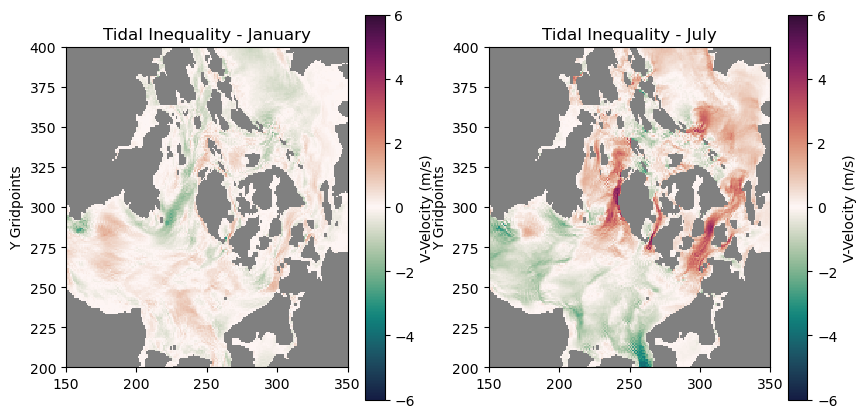

In [ ]:
# Calculating tidal inequality (between floods and ebb)


tid_ineq_jan = jan_hourly.vomecrty[maxfloind_jan, 0] + jan_hourly.vomecrty[maxebbind_jan, 0]
tid_ineq_jul = jul_hourly.vomecrty[maxfloind_jul, 0] + jul_hourly.vomecrty[maxfloind_jul, 0]

fig,ax = plt.subplots(1,2,figsize=(10,10))

cmap = cm.curl
cmap.set_bad('gray')

vfull = np.ma.masked_array(tid_ineq_jul, mask=vmask[0])
ax[1].pcolormesh(vfull)
colours = ax[1].pcolormesh(vfull, cmap=cmap,
                               vmin=-6,vmax=6
                             )
ax[1].set_ylim([200,400])
ax[1].set_xlim([150,350])
cb = fig.colorbar(colours, ax=ax[1],shrink=0.5)
cb.set_label('V-Velocity (m/s)')
viz_tools.set_aspect(ax[1]);
ax[1].set_ylabel('Y Gridpoints')
ax[1].set_title(f'Tidal Inequality - July')

vfull2 = np.ma.masked_array(tid_ineq_jan, mask=vmask[0])
ax[0].pcolormesh(vfull2)
colours = ax[0].pcolormesh(vfull2, cmap=cmap,
                               vmin=-6,vmax=6
                             )
ax[0].set_ylim([200,400])
ax[0].set_xlim([150,350])
cb = fig.colorbar(colours, ax=ax[0],shrink=0.5)
cb.set_label('V-Velocity (m/s)')
viz_tools.set_aspect(ax[0]);
ax[0].set_ylabel('Y Gridpoints')
ax[0].set_title(f'Tidal Inequality - January')

## Haro Tidal Analysis

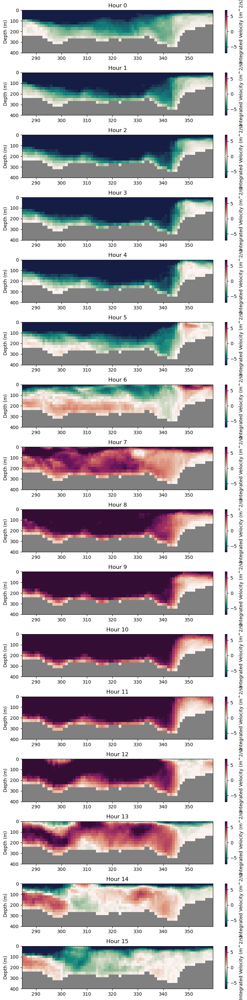

In [ ]:
# Haro - cross section throughout tidal cycle

fig, ax = plt.subplots(16,1, figsize=(8,30))

for k in range(16):
    
    haro_int = np.zeros((40,haro_latrange[1]-haro_latrange[0]))

    for i in range(haro_latrange[0],haro_latrange[1]):
        for j in range(40):
            haro_int[j,i-haro_latrange[0]] = sp.integrate.simpson(jan_hourly.vomecrty[k,j,i,haro_lonrange[0]:haro_lonrange[1]])
    
    haro_int[haro_int == 0] = np.nan

    #northvel = np.ma.masked_array(haro_int, mask=vmask[:, haro_latrange[0]:haro_latrange[1], lon_set])
    colours = ax[k].pcolormesh( vvel.gridY[haro_latrange[0]:haro_latrange[1]],jan_hourly.depth,haro_int, cmap=cmap, vmax=7,vmin=-7)
    ax[k].set_ylim(0, 400)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    ax[k].set_title(f'Hour {date[k].hour}')
    
#ax[0].axvline(x = lon_set,color='k')
fig.tight_layout()

## Vertical Velocity

In [ ]:
#Importing w-velocity data in 2018

wvel1 = xr.open_dataset('/ocean/cstang/general/files_reshaped/SalishSeaCast_monthly_wvel_2018_20180601_20180831.nc')
wvel2 = xr.open_dataset('/ocean/cstang/general/files_reshaped/SalishSeaCast_monthly_wvel_2018_2_20180401_20180630.nc')
wvel3 = xr.open_dataset('/ocean/cstang/general/files_reshaped/SalishSeaCast_monthly_wvel_2018_3_20180701_20180930.nc')
wvel4 = xr.open_dataset('/ocean/cstang/general/files_reshaped/SalishSeaCast_monthly_wvel_2018_4_20181001_20181231.nc')

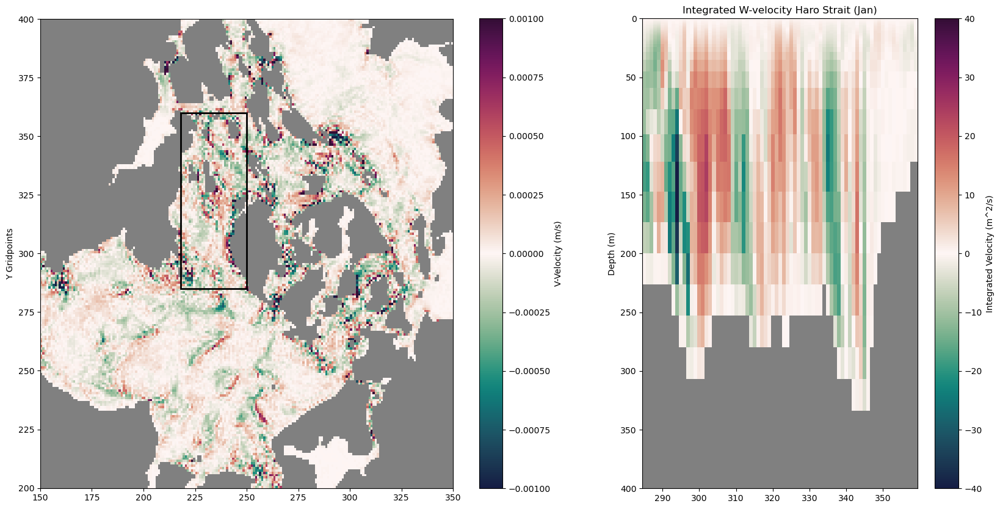

In [ ]:
#Haro - cross section of w-velocity and map

haro_latrange = [285,360]
haro_lonrange = [218,250]

haro_int_jan = np.zeros((40,haro_latrange[1]-haro_latrange[0]))

for i in range(haro_latrange[0],haro_latrange[1]):
    for j in range(40):
        haro_int_jan[j,i-haro_latrange[0]] = sp.integrate.simpson(wvel1.vovecrtz[0,j,i,haro_lonrange[0]:haro_lonrange[1]]*e1t[i,haro_lonrange[0]:haro_lonrange[1]])

haro_int_jan[haro_int_jan == 0] = np.nan

fig, ax = plt.subplots(1,2, figsize=(20, 10),gridspec_kw= {'width_ratios':[1.5,1]})

cmap = cm.curl
cmap.set_bad('gray')
vfull = np.ma.masked_array(wvel1.vovecrtz[0, 3], mask=vmask[0])
ax[0].pcolormesh(vfull)
colours = ax[0].pcolormesh(vfull, cmap=cmap,
                           vmin= -1e-3,vmax = 1e-3
                           )
ax[0].set_ylim([200,400])
ax[0].set_xlim([150,350])
cb = fig.colorbar(colours, ax=ax[0])
cb.set_label('V-Velocity (m/s)')
viz_tools.set_aspect(ax[0]);
ax[0].set_ylabel('Y Gridpoints')

colours = ax[1].pcolormesh( wvel1.gridY[haro_latrange[0]:haro_latrange[1]],wvel1.depth,haro_int_jan, cmap=cmap,
                            vmin=-40,vmax=40
                           )
ax[1].set_ylim(0, 400)
ax[1].invert_yaxis();
cb = fig.colorbar(colours, ax=ax[1])
cb.set_label('Integrated Velocity (m^2/s)');
ax[1].set_title('Integrated W-velocity Haro Strait (Jan)')
ax[1].set_ylabel('Depth (m)')

rect = patches.Rectangle((haro_lonrange[0],haro_latrange[0]),haro_lonrange[1]-haro_lonrange[0],haro_latrange[1]-haro_latrange[0],fill=None,lw=2)
ax[0].add_patch(rect)

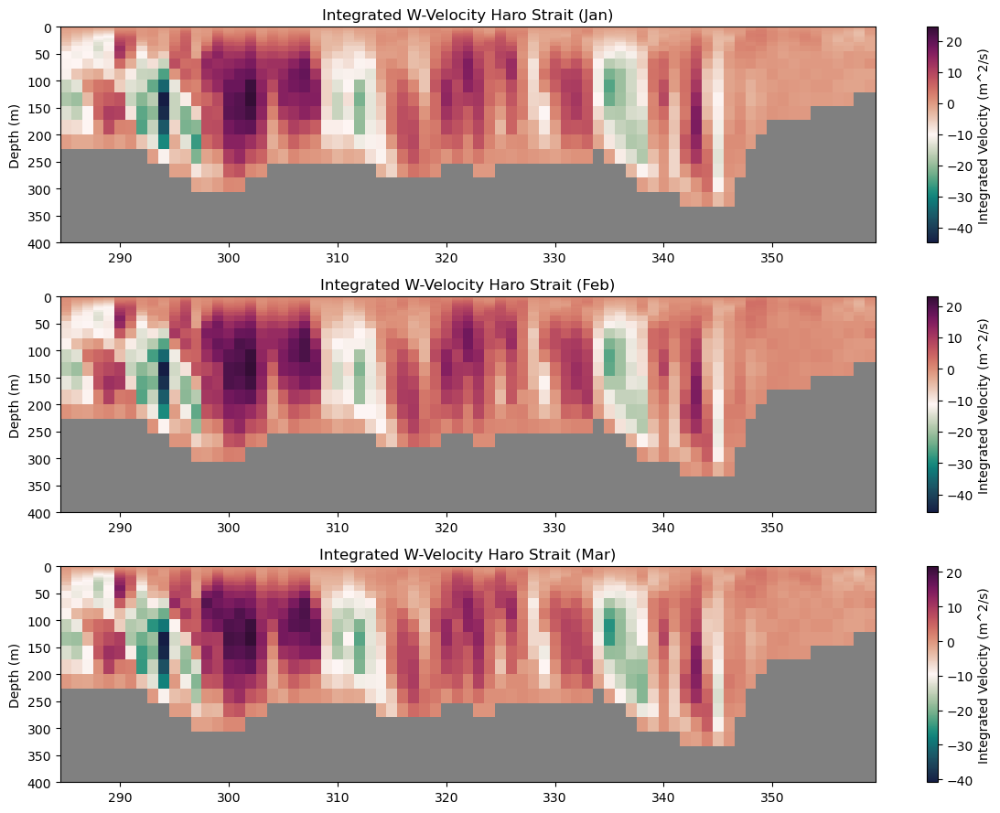

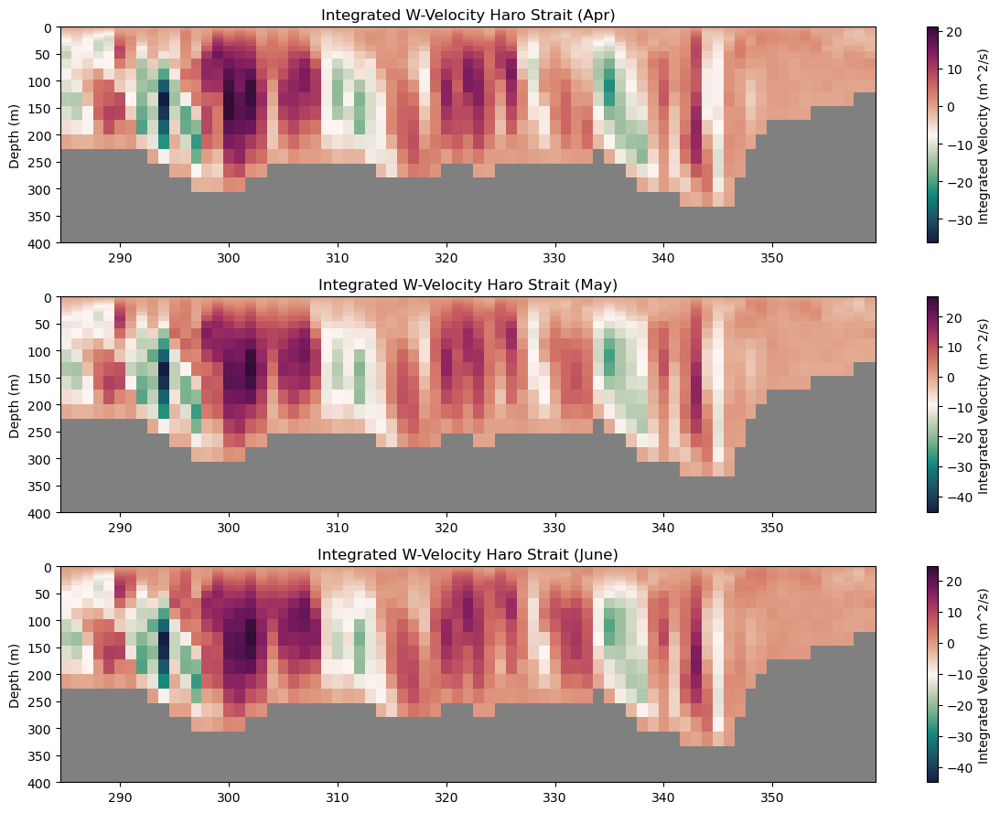

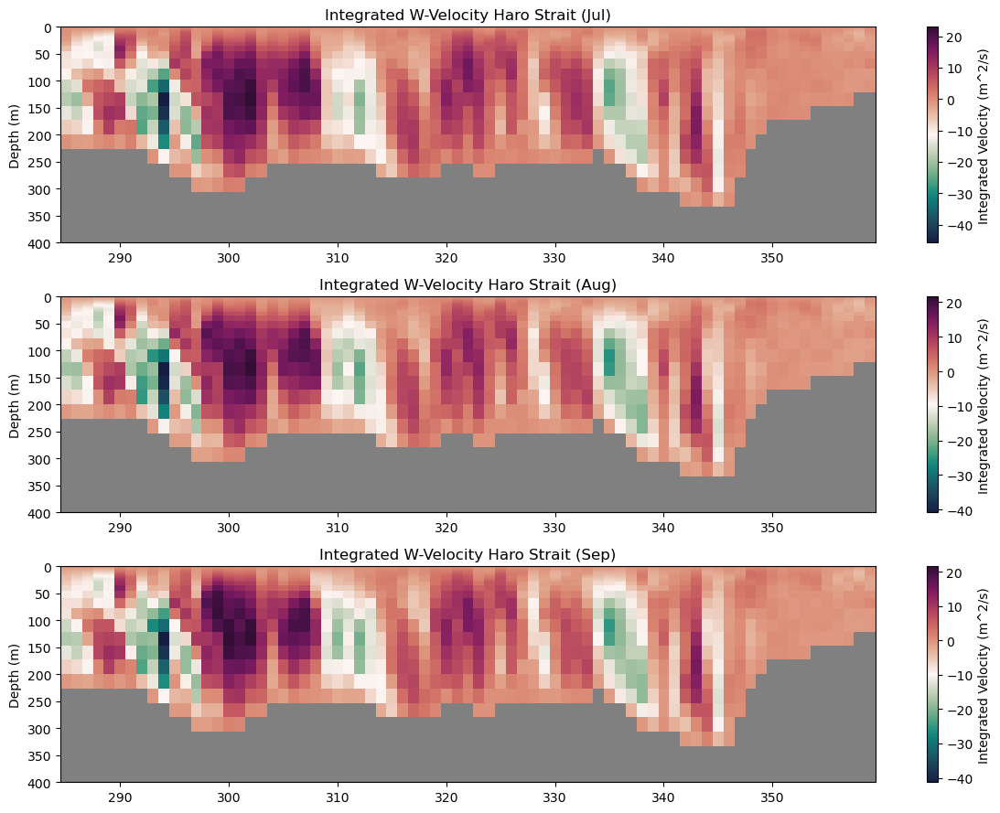

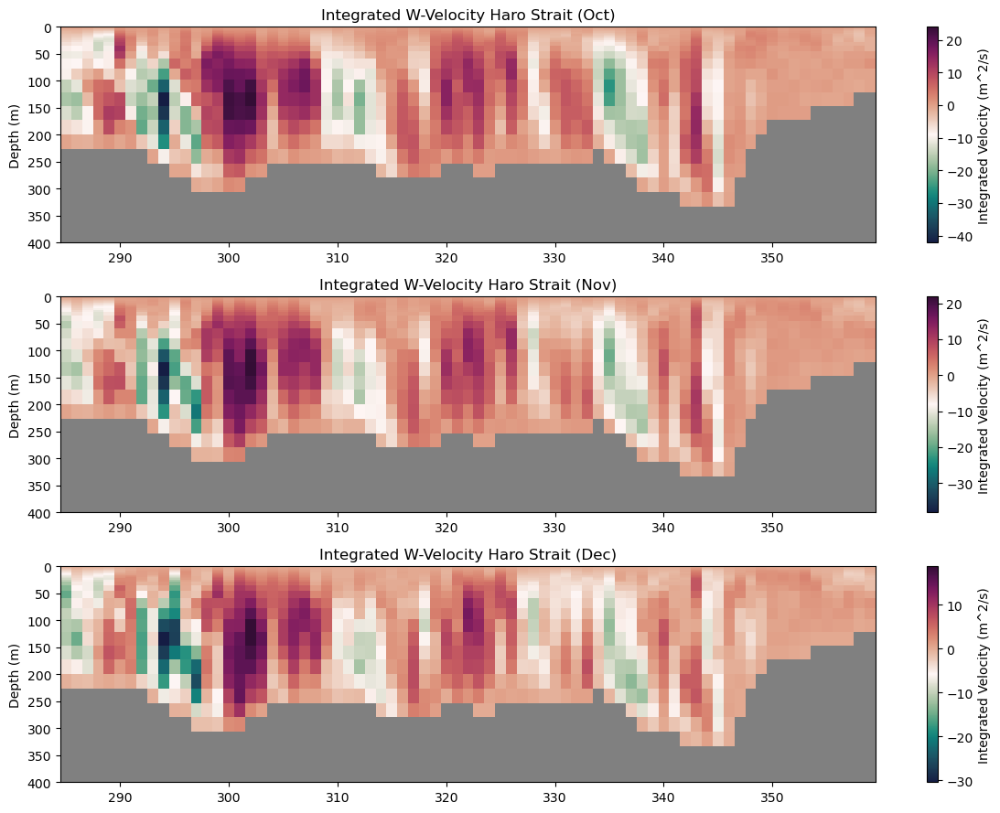

In [ ]:
# Haro - Time series of w velocity

fig, ax = plt.subplots(3,1, figsize=(12, 9))

for k in range(3):
    
    haro_int = np.zeros((40,haro_latrange[1]-haro_latrange[0]))

    for i in range(haro_latrange[0],haro_latrange[1]):
        for j in range(40):
            haro_int[j,i-haro_latrange[0]] = sp.integrate.simpson(wvel1.vovecrtz[k,j,i,haro_lonrange[0]:haro_lonrange[1]]*e1t[i,haro_lonrange[0]:haro_lonrange[1]])
    
    haro_int[haro_int == 0] = np.nan

    colours = ax[k].pcolormesh( wvel1.gridY[haro_latrange[0]:haro_latrange[1]],wvel1.depth,haro_int, cmap=cmap, 
                               
                                #vmax=4000,vmin=-4000
                               )
    ax[k].set_ylim(0, 400)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated W-Velocity Haro Strait (Jan)')
ax[1].set_title(r'Integrated W-Velocity Haro Strait (Feb)')
ax[2].set_title(r'Integrated W-Velocity Haro Strait (Mar)')
fig.tight_layout()

fig, ax = plt.subplots(3,1, figsize=(12, 9))

for k in range(3):
    
    haro_int = np.zeros((40,haro_latrange[1]-haro_latrange[0]))

    for i in range(haro_latrange[0],haro_latrange[1]):
        for j in range(40):
            haro_int[j,i-haro_latrange[0]] = sp.integrate.simpson(wvel2.vovecrtz[k,j,i,haro_lonrange[0]:haro_lonrange[1]]*e1t[i,haro_lonrange[0]:haro_lonrange[1]])
    
    haro_int[haro_int == 0] = np.nan

    colours = ax[k].pcolormesh( wvel2.gridY[haro_latrange[0]:haro_latrange[1]],wvel2.depth,haro_int, cmap=cmap, 
                               
                                #vmax=4000,vmin=-4000
                               )
    ax[k].set_ylim(0, 400)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated W-Velocity Haro Strait (Apr)')
ax[1].set_title(r'Integrated W-Velocity Haro Strait (May)')
ax[2].set_title(r'Integrated W-Velocity Haro Strait (June)')
fig.tight_layout()

fig, ax = plt.subplots(3,1, figsize=(12, 9))

for k in range(3):
    
    haro_int = np.zeros((40,haro_latrange[1]-haro_latrange[0]))

    for i in range(haro_latrange[0],haro_latrange[1]):
        for j in range(40):
            haro_int[j,i-haro_latrange[0]] = sp.integrate.simpson(wvel3.vovecrtz[k,j,i,haro_lonrange[0]:haro_lonrange[1]]*e1t[i,haro_lonrange[0]:haro_lonrange[1]])
    
    haro_int[haro_int == 0] = np.nan

    colours = ax[k].pcolormesh( wvel3.gridY[haro_latrange[0]:haro_latrange[1]],wvel3.depth,haro_int, cmap=cmap, 
                               
                                #vmax=4000,vmin=-4000
                               )
    ax[k].set_ylim(0, 400)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated W-Velocity Haro Strait (Jul)')
ax[1].set_title(r'Integrated W-Velocity Haro Strait (Aug)')
ax[2].set_title(r'Integrated W-Velocity Haro Strait (Sep)')
fig.tight_layout()

fig, ax = plt.subplots(3,1, figsize=(12, 9))

for k in range(3):
    
    haro_int = np.zeros((40,haro_latrange[1]-haro_latrange[0]))

    for i in range(haro_latrange[0],haro_latrange[1]):
        for j in range(40):
            haro_int[j,i-haro_latrange[0]] = sp.integrate.simpson(wvel4.vovecrtz[k,j,i,haro_lonrange[0]:haro_lonrange[1]]*e1t[i,haro_lonrange[0]:haro_lonrange[1]])
    
    haro_int[haro_int == 0] = np.nan

    colours = ax[k].pcolormesh( wvel4.gridY[haro_latrange[0]:haro_latrange[1]],wvel4.depth,haro_int, cmap=cmap, 
                               
                                #vmax=4000,vmin=-4000
                               )
    ax[k].set_ylim(0, 400)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated W-Velocity Haro Strait (Oct)')
ax[1].set_title(r'Integrated W-Velocity Haro Strait (Nov)')
ax[2].set_title(r'Integrated W-Velocity Haro Strait (Dec)')
#ax[0].axvline(x = lon_set,color='k')
fig.tight_layout()

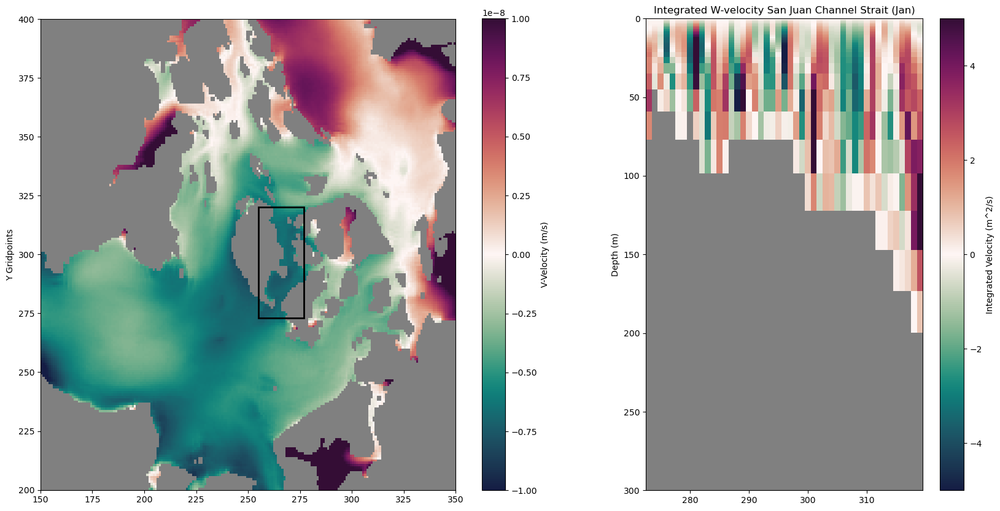

In [ ]:
#SJC - January cross section of w-velocity

sjc_latrange = [273,320]
sjc_lonrange = [255,277]

sjc_int_jan = np.zeros((40,sjc_latrange[1]-sjc_latrange[0]))

for i in range(sjc_latrange[0],sjc_latrange[1]):
    for j in range(40):
        sjc_int_jan[j,i-sjc_latrange[0]] = sp.integrate.simpson(wvel1.vovecrtz[0,j,i,sjc_lonrange[0]:sjc_lonrange[1]]*e1t[i,sjc_lonrange[0]:sjc_lonrange[1]])

sjc_int_jan[sjc_int_jan == 0] = np.nan

fig, ax = plt.subplots(1,2, figsize=(20, 10),gridspec_kw= {'width_ratios':[1.5,1]})

cmap = cm.curl
cmap.set_bad('gray')
vfull = np.ma.masked_array(wvel1.vovecrtz[0, 0], mask=vmask[0])
ax[0].pcolormesh(vfull)
colours = ax[0].pcolormesh(vfull, cmap=cmap,
                            vmin=-1e-8,vmax = 1e-8
                           )
ax[0].set_ylim([200,400])
ax[0].set_xlim([150,350])
cb = fig.colorbar(colours, ax=ax[0])
cb.set_label('V-Velocity (m/s)')
viz_tools.set_aspect(ax[0]);
ax[0].set_ylabel('Y Gridpoints')

colours = ax[1].pcolormesh( wvel1.gridY[sjc_latrange[0]:sjc_latrange[1]],wvel1.depth,sjc_int_jan, cmap=cmap,
                            vmin=-5,vmax = 5
                           )
ax[1].set_ylim(0, 300)
ax[1].invert_yaxis();
cb = fig.colorbar(colours, ax=ax[1])
cb.set_label('Integrated Velocity (m^2/s)');
ax[1].set_title('Integrated W-velocity San Juan Channel Strait (Jan)')
ax[1].set_ylabel('Depth (m)')

rect = patches.Rectangle((sjc_lonrange[0],sjc_latrange[0]),sjc_lonrange[1]-sjc_lonrange[0],sjc_latrange[1]-sjc_latrange[0],fill=None,lw=2)
ax[0].add_patch(rect)

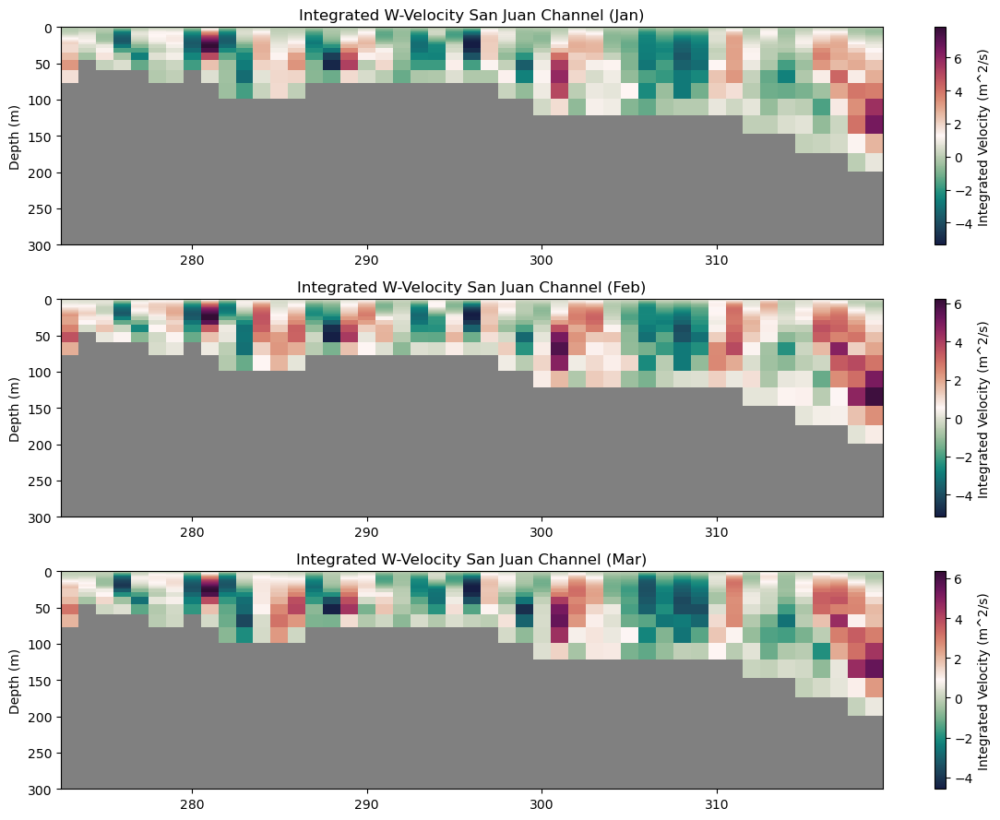

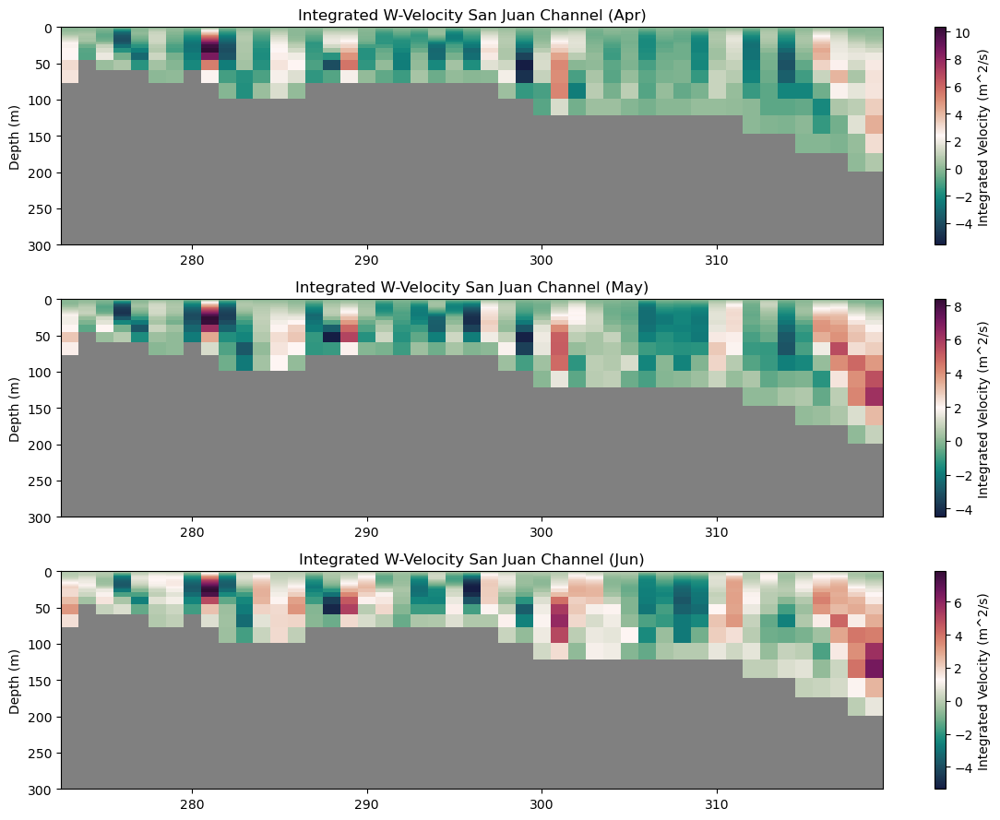

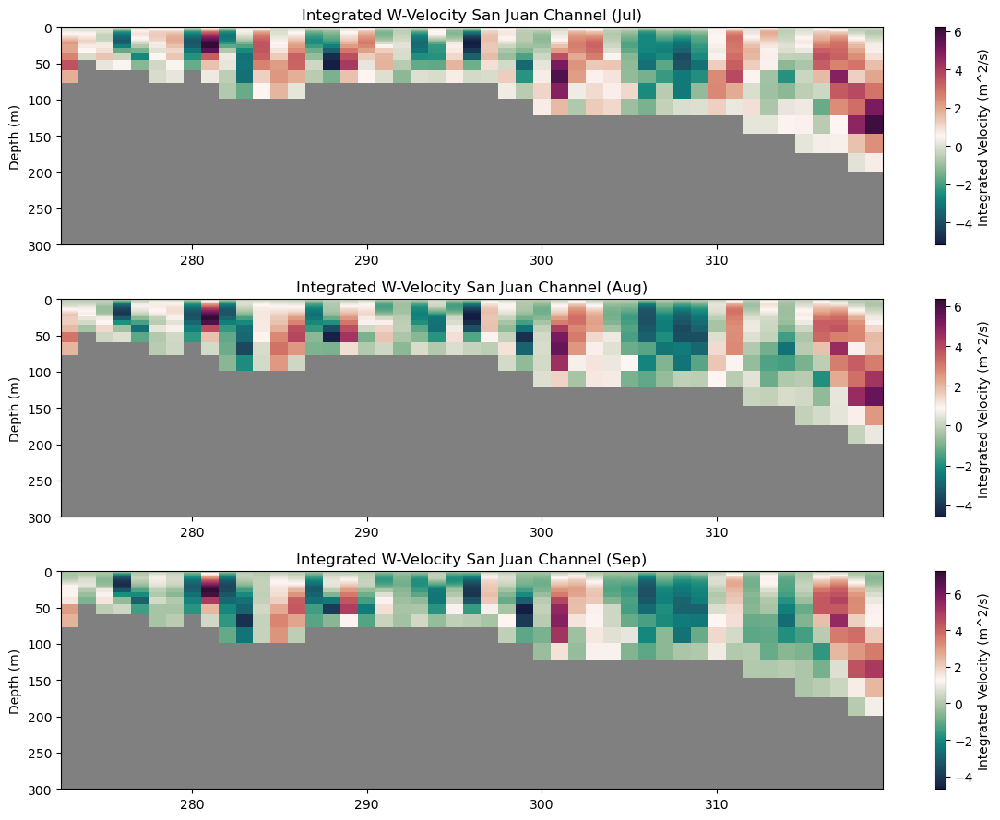

In [ ]:
# SJC - Time series of w velocities

fig, ax = plt.subplots(3,1, figsize=(12, 9))

for k in range(3):
    
    sjc_int = np.zeros((40,sjc_latrange[1]-sjc_latrange[0]))

    for i in range(sjc_latrange[0],sjc_latrange[1]):
        for j in range(40):
            sjc_int[j,i-sjc_latrange[0]] = sp.integrate.simpson(wvel1.vovecrtz[k,j,i,sjc_lonrange[0]:sjc_lonrange[1]]*e1t[i,sjc_lonrange[0]:sjc_lonrange[1]])
    
    sjc_int[sjc_int == 0] = np.nan

    colours = ax[k].pcolormesh( wvel1.gridY[sjc_latrange[0]:sjc_latrange[1]],wvel1.depth,sjc_int, cmap=cmap,
                                # vmin=-1000,vmax = 1000
                               )
    ax[k].set_ylim(0, 300)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated W-Velocity San Juan Channel (Jan)')
ax[1].set_title(r'Integrated W-Velocity San Juan Channel (Feb)')
ax[2].set_title(r'Integrated W-Velocity San Juan Channel (Mar)')
fig.tight_layout()


fig, ax = plt.subplots(3,1, figsize=(12, 9))

for k in range(3):
    
    sjc_int = np.zeros((40,sjc_latrange[1]-sjc_latrange[0]))

    for i in range(sjc_latrange[0],sjc_latrange[1]):
        for j in range(40):
            sjc_int[j,i-sjc_latrange[0]] = sp.integrate.simpson(wvel2.vovecrtz[k,j,i,sjc_lonrange[0]:sjc_lonrange[1]]*e1t[i,sjc_lonrange[0]:sjc_lonrange[1]])
    
    sjc_int[sjc_int == 0] = np.nan

    colours = ax[k].pcolormesh( wvel2.gridY[sjc_latrange[0]:sjc_latrange[1]],wvel2.depth,sjc_int, cmap=cmap,
                                # vmin=-1000,vmax = 1000
                               )
    ax[k].set_ylim(0, 300)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated W-Velocity San Juan Channel (Apr)')
ax[1].set_title(r'Integrated W-Velocity San Juan Channel (May)')
ax[2].set_title(r'Integrated W-Velocity San Juan Channel (Jun)')
fig.tight_layout()


fig, ax = plt.subplots(3,1, figsize=(12, 9))

for k in range(3):
    
    sjc_int = np.zeros((40,sjc_latrange[1]-sjc_latrange[0]))

    for i in range(sjc_latrange[0],sjc_latrange[1]):
        for j in range(40):
            sjc_int[j,i-sjc_latrange[0]] = sp.integrate.simpson(wvel3.vovecrtz[k,j,i,sjc_lonrange[0]:sjc_lonrange[1]]*e1t[i,sjc_lonrange[0]:sjc_lonrange[1]])
    
    sjc_int[sjc_int == 0] = np.nan

    colours = ax[k].pcolormesh( wvel3.gridY[sjc_latrange[0]:sjc_latrange[1]],wvel3.depth,sjc_int, cmap=cmap,
                                # vmin=-1000,vmax = 1000
                               )
    ax[k].set_ylim(0, 300)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated W-Velocity San Juan Channel (Jul)')
ax[1].set_title(r'Integrated W-Velocity San Juan Channel (Aug)')
ax[2].set_title(r'Integrated W-Velocity San Juan Channel (Sep)')
fig.tight_layout()

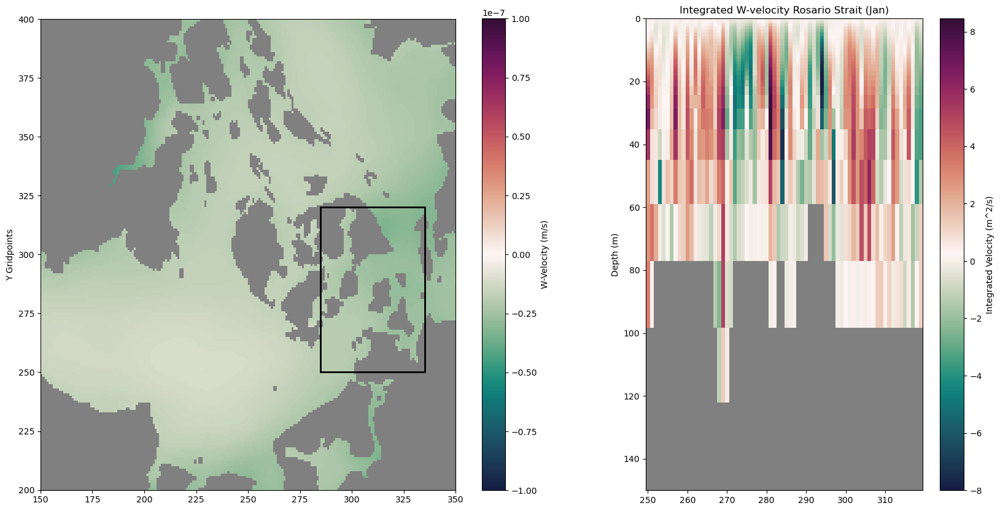

In [ ]:
#Rosario - Jan cross section of w-velocity

ros_latrange = [250,320]
ros_lonrange = [285,335]

ros_int_jan = np.zeros((40,ros_latrange[1]-ros_latrange[0]))

for i in range(ros_latrange[0],ros_latrange[1]):
    for j in range(40):
        ros_int_jan[j,i-ros_latrange[0]] = sp.integrate.simpson(wvel1.vovecrtz[0,j,i,ros_lonrange[0]:ros_lonrange[1]]*e1t[i,ros_lonrange[0]:ros_lonrange[1]])

ros_int_jan[ros_int_jan == 0] = np.nan

fig, ax = plt.subplots(1,2, figsize=(20, 10),gridspec_kw= {'width_ratios':[1.5,1]})

cmap = cm.curl
cmap.set_bad('gray')
vfull = np.ma.masked_array(wvel2.vovecrtz[0, 0], mask=vmask[0])
ax[0].pcolormesh(vfull)
colours = ax[0].pcolormesh(vfull, cmap=cmap,
                            vmin=-1e-7,vmax = 1e-7
                           )
ax[0].set_ylim([200,400])
ax[0].set_xlim([150,350])
cb = fig.colorbar(colours, ax=ax[0])
cb.set_label('W-Velocity (m/s)')
viz_tools.set_aspect(ax[0]);
ax[0].set_ylabel('Y Gridpoints')

colours = ax[1].pcolormesh( wvel1.gridY[ros_latrange[0]:ros_latrange[1]],wvel1.depth,ros_int_jan, cmap=cmap,
                            # vmin=-1000,vmax = 1000
                           )
ax[1].set_ylim(0, 150)
ax[1].invert_yaxis();
cb = fig.colorbar(colours, ax=ax[1])
cb.set_label('Integrated Velocity (m^2/s)');
ax[1].set_title('Integrated W-velocity Rosario Strait (Jan)')
ax[1].set_ylabel('Depth (m)')

rect = patches.Rectangle((ros_lonrange[0],ros_latrange[0]),ros_lonrange[1]-ros_lonrange[0],ros_latrange[1]-ros_latrange[0],fill=None,lw=2)
ax[0].add_patch(rect)

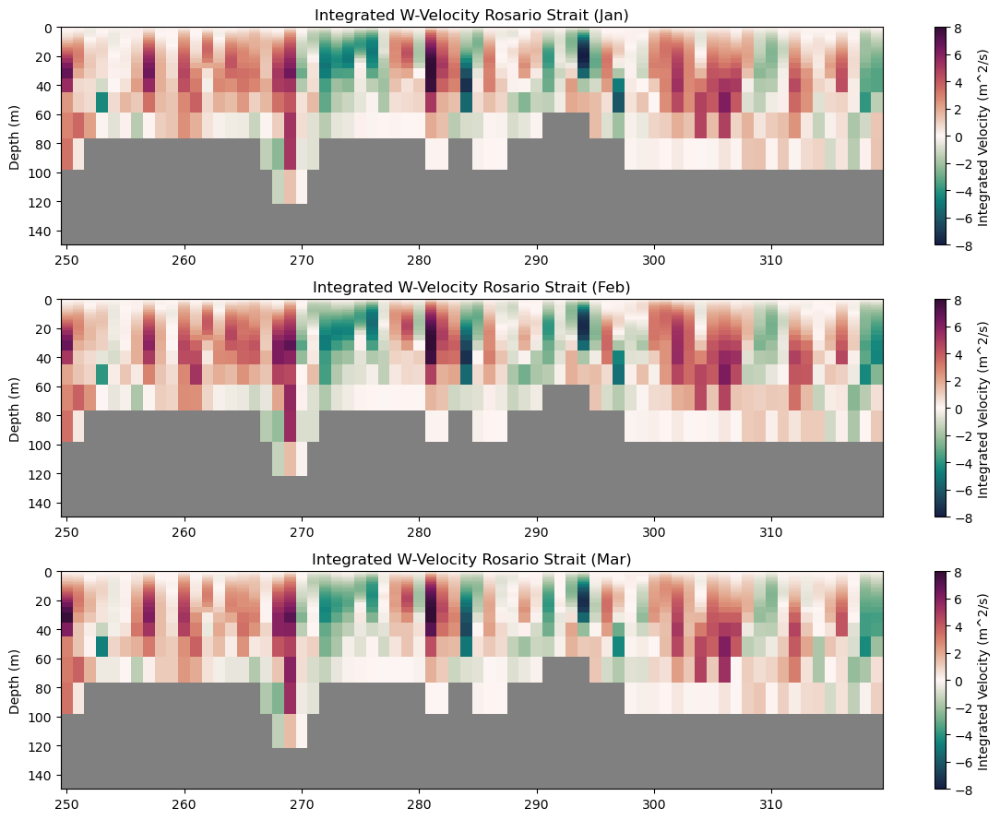

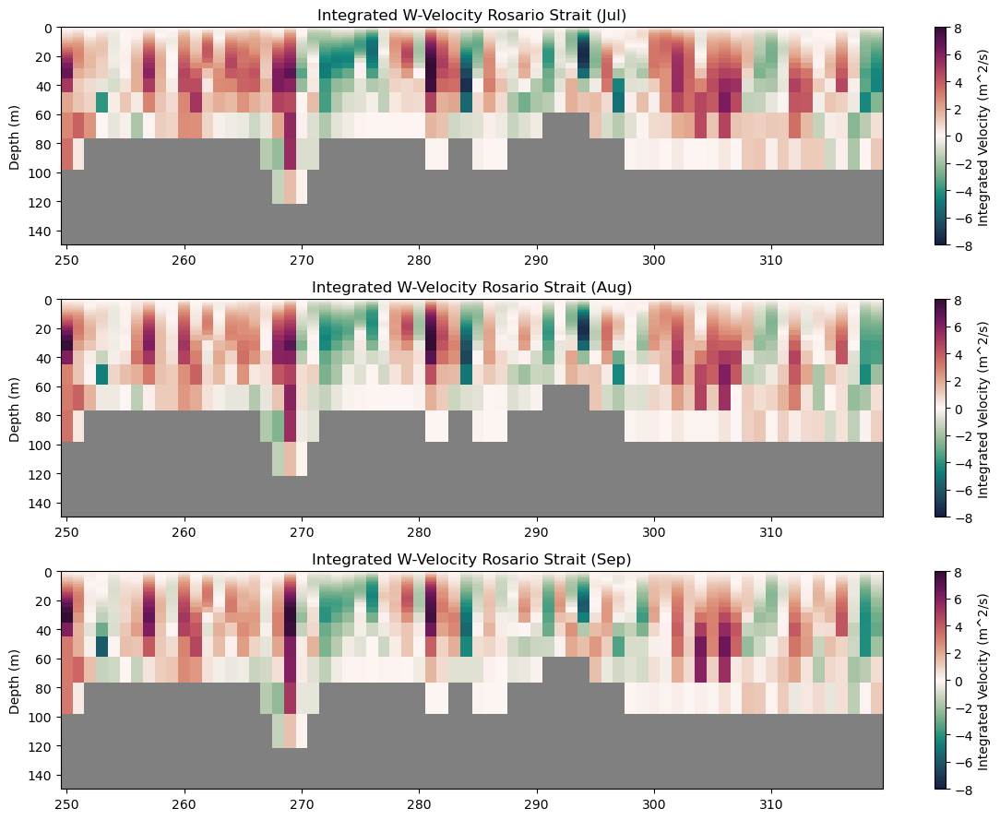

In [ ]:
# Rosario - Time series of w-velocity

fig, ax = plt.subplots(3,1, figsize=(12, 9))

for k in range(3):
    
    ros_int = np.zeros((40,ros_latrange[1]-ros_latrange[0]))

    for i in range(ros_latrange[0],ros_latrange[1]):
        for j in range(40):
            ros_int[j,i-ros_latrange[0]] = sp.integrate.simpson(wvel1.vovecrtz[k,j,i,ros_lonrange[0]:ros_lonrange[1]]*e1t[i,ros_lonrange[0]:ros_lonrange[1]])
    
    ros_int[ros_int == 0] = np.nan

    colours = ax[k].pcolormesh( wvel1.gridY[ros_latrange[0]:ros_latrange[1]],wvel1.depth,ros_int, cmap=cmap,
                                 vmin=-8,vmax=8
                               )
    ax[k].set_ylim(0, 150)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated W-Velocity Rosario Strait (Jan)')
ax[1].set_title(r'Integrated W-Velocity Rosario Strait (Feb)')
ax[2].set_title(r'Integrated W-Velocity Rosario Strait (Mar)')
fig.tight_layout()

fig, ax = plt.subplots(3,1, figsize=(12, 9))

for k in range(3):
    
    ros_int = np.zeros((40,ros_latrange[1]-ros_latrange[0]))

    for i in range(ros_latrange[0],ros_latrange[1]):
        for j in range(40):
            ros_int[j,i-ros_latrange[0]] = sp.integrate.simpson(wvel3.vovecrtz[k,j,i,ros_lonrange[0]:ros_lonrange[1]]*e1t[i,ros_lonrange[0]:ros_lonrange[1]])
    
    ros_int[ros_int == 0] = np.nan

    colours = ax[k].pcolormesh( wvel3.gridY[ros_latrange[0]:ros_latrange[1]],wvel3.depth,ros_int, cmap=cmap,
                                 vmin=-8,vmax=8
                               )
    ax[k].set_ylim(0, 150)
    ax[k].invert_yaxis();
    cb = fig.colorbar(colours, ax=ax[k])
    cb.set_label('Integrated Velocity (m^2/s)');
    ax[k].set_ylabel('Depth (m)')
    
ax[0].set_title(r'Integrated W-Velocity Rosario Strait (Jul)')
ax[1].set_title(r'Integrated W-Velocity Rosario Strait (Aug)')
ax[2].set_title(r'Integrated W-Velocity Rosario Strait (Sep)')
fig.tight_layout()


